<a href="https://colab.research.google.com/github/lizaoh/cognitive_graphs/blob/main/mturk_catapult_skill_graphs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Top of script

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
# from markovchain import MarkovChain
import networkx as nx
from networkx.drawing.nx_pydot import write_dot
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
import matplotlib.image as mpimg
import pickle
import cv2
from scipy.special import kl_div, rel_entr
from scipy.stats import wasserstein_distance, chisquare
import statistics
import scipy.stats as stats
import math
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 18})

# Load in data
Clean MTurk data saved from the first [colab notebook](https://colab.research.google.com/drive/14aWe82yTITLu16RVpb-Db8nm_Qb0enjW?usp=sharing) for analyzing the MTurk data. Removed participants who scored only zeros for the entire game or had logging issues (e.g., duplicate or missing trial data)

In [3]:
df_clean = pd.read_pickle("/content/gdrive/MyDrive/Colab Notebooks/YoshimiLab/mturk_bowman_jan2022/dataframes/mturk_clean_df")
# df_clean = pickle.load(open("/content/gdrive/MyDrive/Colab Notebooks/YoshimiLab/mturk_bowman_jan2022/dataframes/mturk_clean_df", "rb"))

df_clean['subj_num'] = [n for n in range(len(df_clean['name']))]

In [4]:
df_clean.head(3)

,name,age,experience,input_device,trial_number,x,y,score,current_total_score,current_best_score,overall_best_score,subj_num
0,user_1642085809373,23,4,0,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[105.0, 80.0, 97.0, 81.0, 81.0, 109.0, 97.0, 8...","[104.0, 119.0, 114.0, 113.0, 113.0, 124.0, 112...","[51.0, 80.0, 72.0, 79.0, 79.0, 0.0, 73.0, 71.0...","[51.0, 131.0, 203.0, 282.0, 361.0, 361.0, 434....","[51.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80....",99.0,0
1,user_1642085801314,61,4,0,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[40.0, 88.0, 105.0, 75.0, 118.0, 93.0, 123.0, ...","[91.0, 65.0, 56.0, 70.0, 61.0, 72.0, 50.0, 39....","[0.0, 78.0, 66.0, 0.0, 21.0, 97.0, 3.0, 0.0, 0...","[0.0, 78.0, 144.0, 144.0, 165.0, 262.0, 265.0,...","[0.0, 78.0, 78.0, 78.0, 78.0, 97.0, 97.0, 97.0...",97.0,1
2,user_1642085860169,24,5,0,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[123.0, 94.0, 111.0, 78.0, 115.0, 95.0, 97.0, ...","[108.0, 82.0, 96.0, 71.0, 87.0, 100.0, 101.0, ...","[0.0, 97.0, 36.0, 0.0, 25.0, 87.0, 79.0, 84.0,...","[0.0, 97.0, 133.0, 133.0, 158.0, 245.0, 324.0,...","[0.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0...",99.0,2


In [5]:
# Df with one row per trial for each participant
coord_df = df_clean.explode(['trial_number', 'x', 'y', 'score', 'current_total_score', 'current_best_score'])
coord_df['coord'] = coord_df[['x', 'y']].apply(np.array, axis=1)

In [6]:
coord_df.head(5)

,name,age,experience,input_device,trial_number,x,y,score,current_total_score,current_best_score,overall_best_score,subj_num,coord
0,user_1642085809373,23,4,0,1.0,105.0,104.0,51.0,51.0,51.0,99.0,0,"[105.0, 104.0]"
0,user_1642085809373,23,4,0,2.0,80.0,119.0,80.0,131.0,80.0,99.0,0,"[80.0, 119.0]"
0,user_1642085809373,23,4,0,3.0,97.0,114.0,72.0,203.0,80.0,99.0,0,"[97.0, 114.0]"
0,user_1642085809373,23,4,0,4.0,81.0,113.0,79.0,282.0,80.0,99.0,0,"[81.0, 113.0]"
0,user_1642085809373,23,4,0,5.0,81.0,113.0,79.0,361.0,80.0,99.0,0,"[81.0, 113.0]"


# Functions

In [7]:
def mturk_get_grid_id(subjects=None, df=None, grid_res=None, x_range=[0, 800], y_range=[0, 600]):
  grid_id = pd.DataFrame()
  # Everyone here has 50 trials
  trial_nums = np.array([i for i in range(1, 50+1)])

  if subjects is None:
      subjects = df['name'].unique()

  for subj in subjects:
    coords_df = pd.DataFrame()

    subj_df = df.loc[df['name'] == subj]

    xcoords = np.array(subj_df['x'])
    ycoords = np.array(subj_df['y'])

    _, x_edges, y_edges = np.histogram2d(xcoords, ycoords, bins=grid_res,
                                         range=[x_range, y_range])

    # Number of edges is one larger than grid size
    # GPT suggests not including rightmost edge because number of bins will be equal to grid size + 1
    x_edges = x_edges[:-1]
    y_edges = y_edges[:-1]

    x_id, y_id = None, None

    for trial, (x, y) in enumerate(zip(xcoords, ycoords)):
        if trial > 0:
            prev_x_id = x_id
            prev_y_id = y_id
        else:
            prev_x_id = None
            prev_y_id = None

        # right=False means that right edge is not included but left edge is (bins[i-1] <= x < bins[i])
        x_id = np.digitize(x, x_edges, right=False) - 1
        y_id = np.digitize(y, y_edges, right=False) - 1

        # Any point beyond the leftmost or bottommost edge should be zero instead of -1
        if x_id == -1:
            x_id = 0
        if y_id == -1:
            y_id = 0

        if trial > 0:
            prev_x = xcoords[trial - 1]
            prev_y = ycoords[trial - 1]
        else:
            prev_x = None
            prev_y = None

        subj_data = pd.DataFrame({
            'participant': subj,
            'grid_res': grid_res,
            'trial': trial + 1,
            'x': x,
            'y': y,
            'x_id': x_id,
            'y_id': y_id,
            'prev_x': prev_x,
            'prev_y': prev_y,
            'prev_x_id': prev_x_id,
            'prev_y_id': prev_y_id
        }, index=[0])

        coords_df = pd.concat([coords_df, subj_data], ignore_index=True)

    grid_id = pd.concat([grid_id, coords_df], ignore_index=True)

  grid_id['id_coord'] = grid_id[['x_id', 'y_id']].apply(tuple, axis=1)

  return grid_id

In [8]:
def mturk_get_metrics(subjects=None, grid_res=None, grid_id_df=None, trial_window_size=15):
  num_states_df = pd.DataFrame()
  early_trials_df = grid_id_df.groupby('participant').head(trial_window_size)
  late_trials_df = grid_id_df.groupby('participant').tail(trial_window_size)

  for num in early_trials_df['participant'].unique():
    early_states = early_trials_df.loc[early_trials_df['participant'] == num, 'id_coord'].values
    late_states = late_trials_df.loc[late_trials_df['participant'] == num, 'id_coord'].values

    num_early_states = set(early_states)
    num_late_states = set(late_states)

    participant_df = pd.DataFrame({
        'participant': num,
        'grid_res': grid_res,
        'early_num_states': len(num_early_states),
        'late_num_states': len(num_late_states),
        'diff_num_states': len(num_early_states) - len(num_late_states),
        'norm_diff_num_states': (len(num_early_states) - len(num_late_states)) / (grid_res**2)
    }, index=[0])

    num_states_df = pd.concat([num_states_df, participant_df], ignore_index=True)

  return num_states_df

In [9]:
def get_hist_mat(subjects=None, df=None, grid_width=None, trial_window_size=15, x_range=[0, 800], y_range=[0, 600]):
  total_grid_squares = grid_width**2

  # Indexing is adjacency_matrices[subject, early or late, row, columns]
  # Add 1 extra row and column to include the start state (clicking the puck)
  adjacency_matrices = np.zeros((len(subjects), 2, total_grid_squares + 1, total_grid_squares + 1))

  for i, subj in enumerate(subjects):
    xcoords_early = df.loc[i, 'x'][:trial_window_size]
    ycoords_early = df.loc[i, 'y'][:trial_window_size]
    xcoords_late = df.loc[i, 'x'][-trial_window_size:]
    ycoords_late = df.loc[i, 'y'][-trial_window_size:]

    early_hist_mat, _, _ = np.histogram2d(xcoords_early,
                                    ycoords_early,
                                    bins=grid_width,
                                    range=[x_range, y_range])
    late_hist_mat, _, _ = np.histogram2d(xcoords_late,
                                    ycoords_late,
                                    bins=grid_width,
                                    range=[x_range, y_range])

    # Fill first row in each subject's adjacency matrices (for early and late) with the respective probabilities
    # adjacency_matrices[subject, early or late, row, columns]
    adjacency_matrices[i, 0, 0, 1:] = early_hist_mat.flatten()
    adjacency_matrices[i, 1, 0, 1:] = late_hist_mat.flatten()

  # Names each grid square / state as coordinates ((0,0) is bottom left corner)
  states = [(j,i) for i in range((int(np.sqrt(total_grid_squares)))) for j in range((int(np.sqrt(total_grid_squares))))]

  # Coordinate for puck spawn coordinate
  states.insert(0, (grid_width, grid_width))

  return adjacency_matrices, states

In [10]:
def plot_markov_chains(subj_num=[0], adj_mat=None, grid_width=None, df=None,
                       states=None, wt_add=0, wt_mult=1, wt_alpha=1, node_size=90,
                       cmap=plt.cm.Greys, label_pos=0.5, vertical_alignment='center', horizontal_alignment='center',
                       label_alpha=1, as_percent=False, initial_trial='first', final_trial='last',
                       figsize=(10,8)):
  avg_state_probs = pd.DataFrame()
  all_mats = []
  if len(subj_num) == 1:
      all_mats = adj_mat[subj_num]
  elif len(subj_num) > 1:
      for subj in subj_num:
          all_mats.append(adj_mat[subj])
  names = df['name'].unique()

  start_state = states[0]

  for s, subj_mats in enumerate(all_mats):
      num_states = []
      avg_prob = []
      for m, mat in enumerate(subj_mats):
          # A set for saving states used in early trials and late trials (sets don't allow for duplicates, so better than a list here)
          all_destination_states = set()
          nonzero_wts = 0
          # For adding the edge labels with the respective probabilities
          edge_labels = {}

          # Save states used in first and last 15 trials
          for prob, state in zip(mat.flatten(), states):
              if prob > 0:
                  all_destination_states.add(state)
                  nonzero_wts += 1

          destination_state_probs = [[prob, state] for prob, state in \
                                  zip(mat.flatten(), states) \
                                  if state in all_destination_states]

          # Creates Markov chain visualizations using NetworkX
          graph = nx.DiGraph()
          start_state = states[0]
          graph.add_nodes_from(states)
          # pos = nx.circular_layout(graph)
          pos = {state: list(state) for state in states}

          for [prob, dest_state] in destination_state_probs:
              edge_labels[(start_state, dest_state)] = label = f'{prob:.02f}'
              graph.add_edge(start_state,
                                    dest_state,
                                    weight=prob,
                                    label=label
                                    )

          # For making the edges more visible (especially when the probability is 0)
          weights = list(nx.get_edge_attributes(graph, 'weight').values())
          avg_probability = np.sum(weights) / nonzero_wts
          avg_prob.append(avg_probability)
          num_states.append(nonzero_wts)

          # For making the edges more visible (especially when the probability is 0
          weights_scaled_up = [w1 * 10 + 0.25 for w1 in weights]

          # Colors the nodes for the release states light blue and the start state pink
          node_color_map = ['#eaeaea'] * len(states)
          node_color_map[0] = 'pink'
          path_nodes_cmap = ['#1f77b4'] * len(all_destination_states)

          # Arranges nodes according to state coordinates (more crowded and harder to read)
          # pos = {state:list(state) for state in all_destination_states}
          # pos[(-1, -1)] = [-1, -1]

          edge_colors = [cmap(w, alpha=wt_alpha) for w in weights_scaled_up]

          fig, ax = plt.subplots(figsize=figsize)
          nx.draw_networkx(graph,
                            pos,
                            node_color=node_color_map,
                            node_size=node_size,
                            edge_color=edge_colors,
                            width=[w for w in weights_scaled_up],
                            edge_cmap=cmap,
                            with_labels=False)
          # nx.draw_networkx_edge_labels(graph, pos, edge_labels)
          nx.draw_networkx_nodes(graph,
                                pos,
                                nodelist=all_destination_states,
                                node_size=node_size,
                                node_color=path_nodes_cmap)
          if m == 0:
            trial_type = 'first'
          elif m == 1:
            trial_type = 'last'
          plt.title(f'Participant {s} Markov chain for {trial_type} 15 trials')
          plt.axis('off')
          plt.show()

          # max_grid_df = df.loc[df['grid_width'] == grid_width]
          # print(max_grid_df)
          print(f'Subj num {s} name {names[s]}')
          print(f'Number of states visited for {trial_type} 15 trials: {len(weights)}')
          print(f'Average state probability for {trial_type} 15 trials: {avg_probability}')
      # subj_mat_data = pd.DataFrame({
      #                               'subj': s,
      #                               'early_num_states': num_states[0],
      #                               'late_num_states': num_states[1],
      #                               'early_avg': avg_prob[0],
      #                               'late_avg': avg_prob[1]
      #                           }, index=[0])
      # avg_state_probs = pd.concat([avg_state_probs, subj_mat_data], ignore_index=True)

      # diff = max_grid_df.loc[max_grid_df['subj_num'] == s, 'dist_vals'].values[0]
      # early = max_grid_df.loc[max_grid_df['subj_num'] == s, 'early_vals'].values[0]
      # late = max_grid_df.loc[max_grid_df['subj_num'] == s, 'late_vals'].values[0]
      # print(f'Difference in entropy: {diff:.03f}, Early entropy: {early:.03f}, Late entropy: {late:.03f}')

  # return avg_state_probs

# Set grid width

In [11]:
# Gets 5% of the average of the width and height of the screen in pixels
grid_width = math.floor(.05 * ((800 + 600) / 2))
print(grid_width)

35


# Number of states visited in first and last quarter of trials

first 15 and last 15 trials

In [12]:
subjects = coord_df['name'].unique()

mturk_grid_id = mturk_get_grid_id(subjects, coord_df, grid_width)

In [13]:
num_states_df = mturk_get_metrics(subjects=subjects, grid_res=grid_width, grid_id_df=mturk_grid_id, trial_window_size=15)

In [14]:
num_states_df.head(5)

,participant,grid_res,early_num_states,late_num_states,diff_num_states,norm_diff_num_states
0,user_1642085809373,35,9,3,6,0.004898
1,user_1642085801314,35,13,5,8,0.006531
2,user_1642085860169,35,5,4,1,0.000816
3,user_1642085813929,35,10,7,3,0.002449
4,user_1642085816080,35,6,3,3,0.002449


# T test on difference in number of states visited from first and last 15 trials

In [15]:
# Two-tailed dependent samples t-test
stats.ttest_rel(num_states_df['early_num_states'], num_states_df['late_num_states'])

TtestResult(statistic=np.float64(5.585729155533945), pvalue=np.float64(1.4594823748589653e-06), df=np.int64(43))

In [16]:
mean_diff = np.mean(num_states_df['diff_num_states'])
std_diff = np.std(num_states_df['diff_num_states'], ddof=1)

t_stat, p_val = stats.ttest_rel(np.array(num_states_df['early_num_states']), np.array(num_states_df['late_num_states']))

deg_of_freedom = len(num_states_df['early_num_states']) - 1

conf_level = 0.95
alpha = 1 - conf_level
crit_value = stats.t.ppf(1 - alpha / 2, deg_of_freedom)
margin_error = crit_value * (std_diff / np.sqrt(len(num_states_df['diff_num_states'])))
conf_interval = [mean_diff - margin_error, mean_diff + margin_error]

cohen_d = mean_diff / std_diff

print(f"Mean difference: {mean_diff}")
print(f"Standard error of the mean: {std_diff}")
print(f"t-statistic: {t_stat}")
print(f"p-value: {p_val}")
print(f"95% Confidence Interval: {conf_interval}")
print(f"Cohen's d: {cohen_d}")

Mean difference: 2.5454545454545454
Standard error of the mean: 3.022816686273924
t-statistic: 5.585729155533945
p-value: 1.4594823748589653e-06
95% Confidence Interval: [np.float64(1.626434273907476), np.float64(3.464474817001615)]
Cohen's d: 0.8420803540661279


<Axes: >

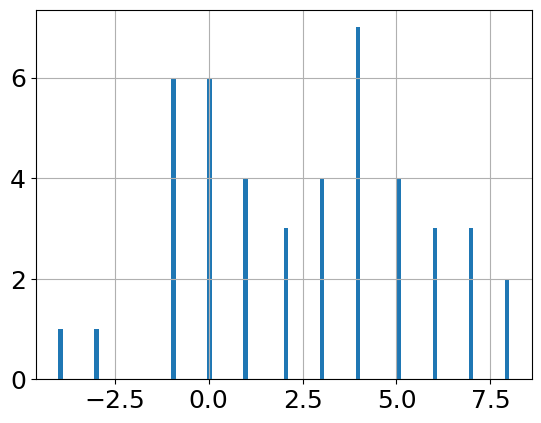

In [17]:
num_states_df['diff_num_states'].hist(bins=100)

In [21]:
num_states_df['diff_num_states'].describe()

,diff_num_states
count,44.000000
mean,2.545455
std,3.022817
min,-4.000000
25%,0.000000
50%,3.000000
75%,5.000000
max,8.000000


In [22]:
num_states_df['early_num_states'].describe()

,early_num_states
count,44.000000
mean,8.840909
std,3.139717
min,3.000000
25%,7.000000
50%,8.000000
75%,11.000000
max,15.000000


In [23]:
num_states_df['late_num_states'].describe()

,late_num_states
count,44.000000
mean,6.295455
std,3.434297
min,2.000000
25%,3.750000
50%,5.000000
75%,8.000000
max,15.000000


# Skill graph visualization
Creates Markov chain visualizations for the probabilities of transitioning to releasing the puck in a certain area / grid square of the game screen from clicking the puck at its starting position. It makes a Markov chain for the first and last 15 trials for each participant.

I used [NetworkX](https://networkx.org/), using [this blog post](https://vknight.org/unpeudemath/code/2015/11/15/Visualising-markov-chains.html) as a guide.

In [24]:
adjacency_matrices, states = get_hist_mat(subjects, df_clean, grid_width, trial_window_size=15)

### Plot Markov chains

Plots Markov chains and print entropy for first and last 15 trials for specified participants. Can also plot histograms for hits in early and late trials.

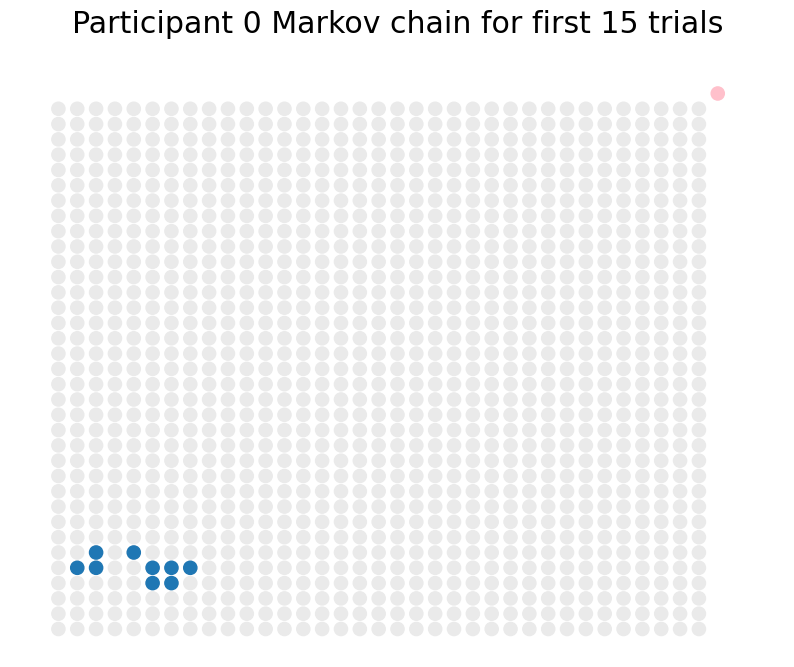

Subj num 0 name user_1642085809373
Number of states visited for first 15 trials: 9
Average state probability for first 15 trials: 1.6666666666666667


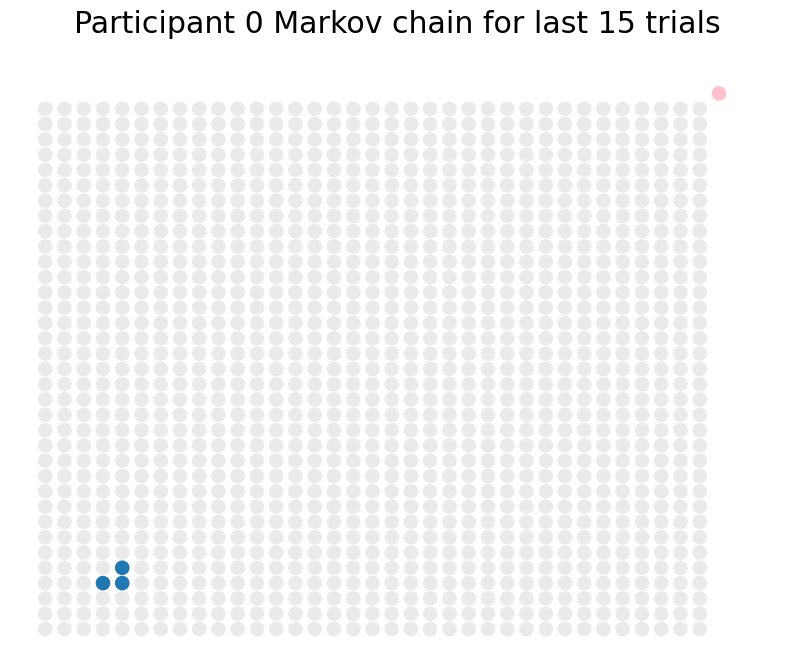

Subj num 0 name user_1642085809373
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


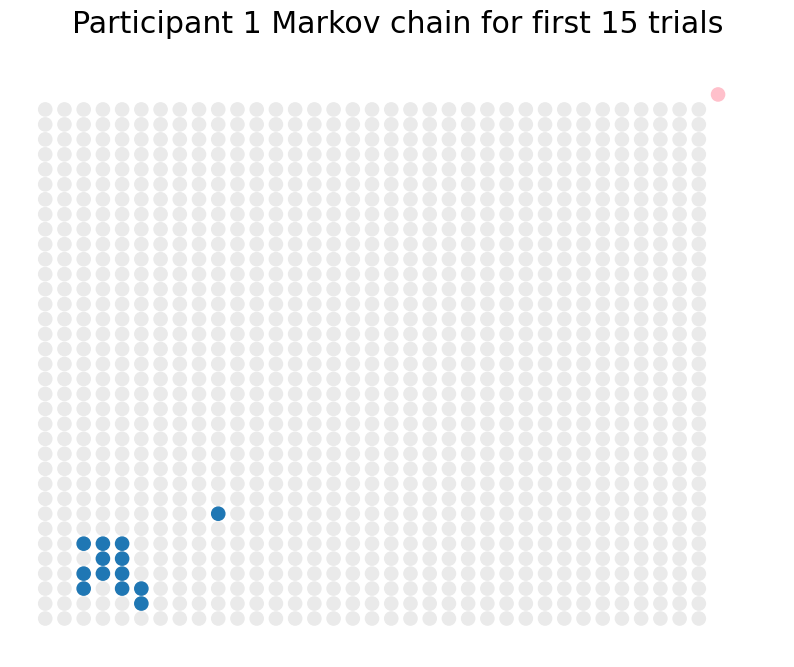

Subj num 1 name user_1642085801314
Number of states visited for first 15 trials: 13
Average state probability for first 15 trials: 1.1538461538461537


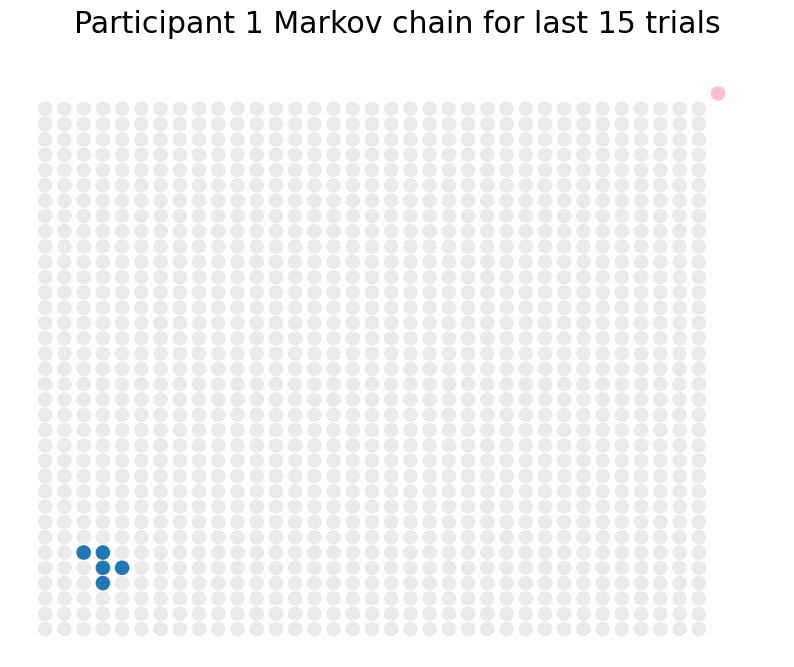

Subj num 1 name user_1642085801314
Number of states visited for last 15 trials: 5
Average state probability for last 15 trials: 3.0


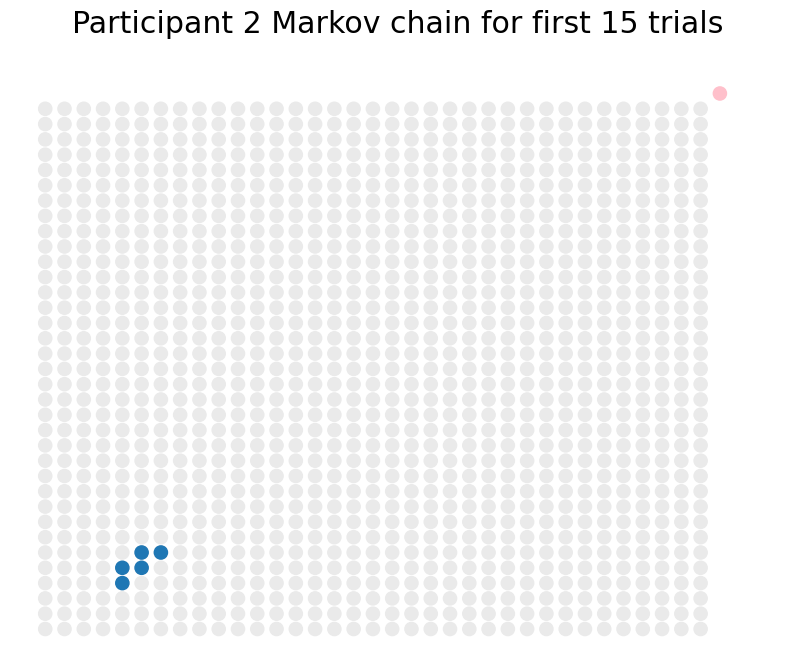

Subj num 2 name user_1642085860169
Number of states visited for first 15 trials: 5
Average state probability for first 15 trials: 3.0


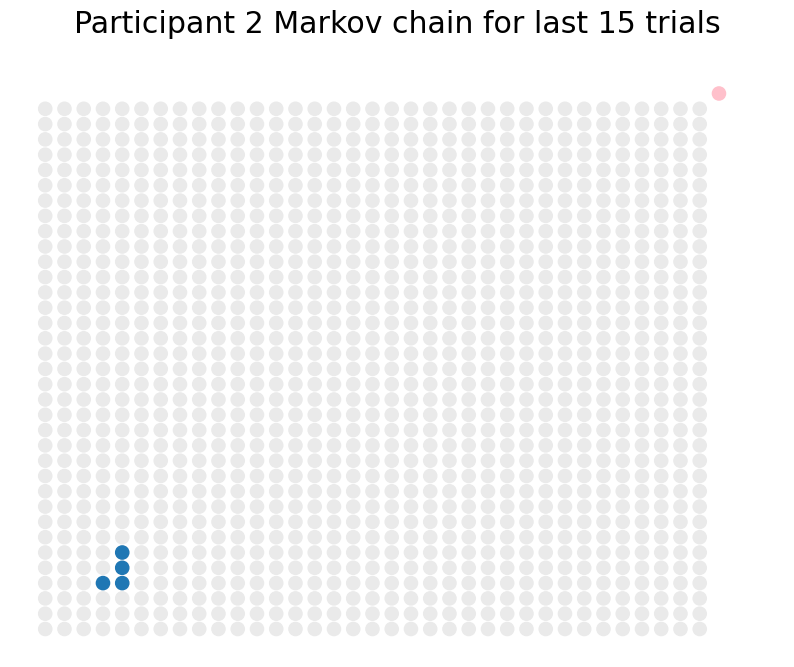

Subj num 2 name user_1642085860169
Number of states visited for last 15 trials: 4
Average state probability for last 15 trials: 3.75


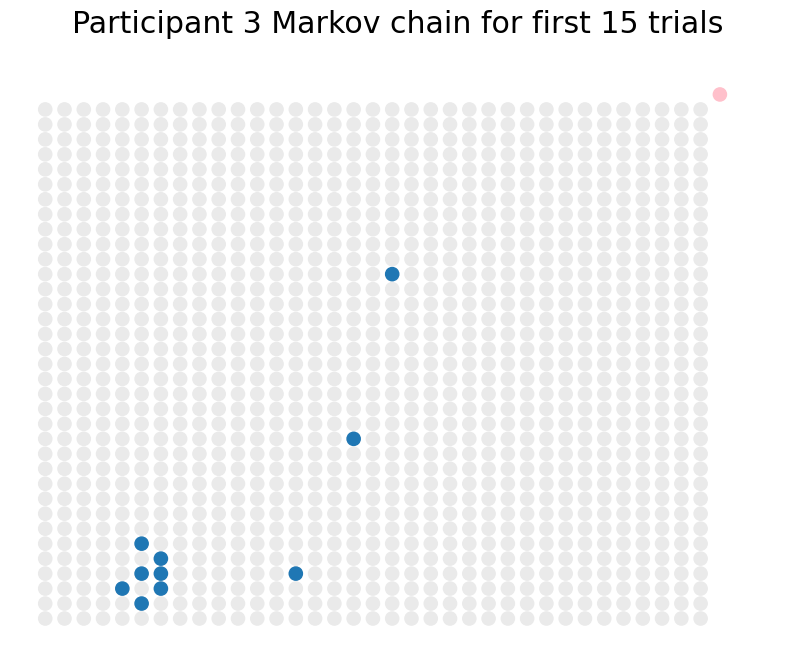

Subj num 3 name user_1642085813929
Number of states visited for first 15 trials: 10
Average state probability for first 15 trials: 1.5


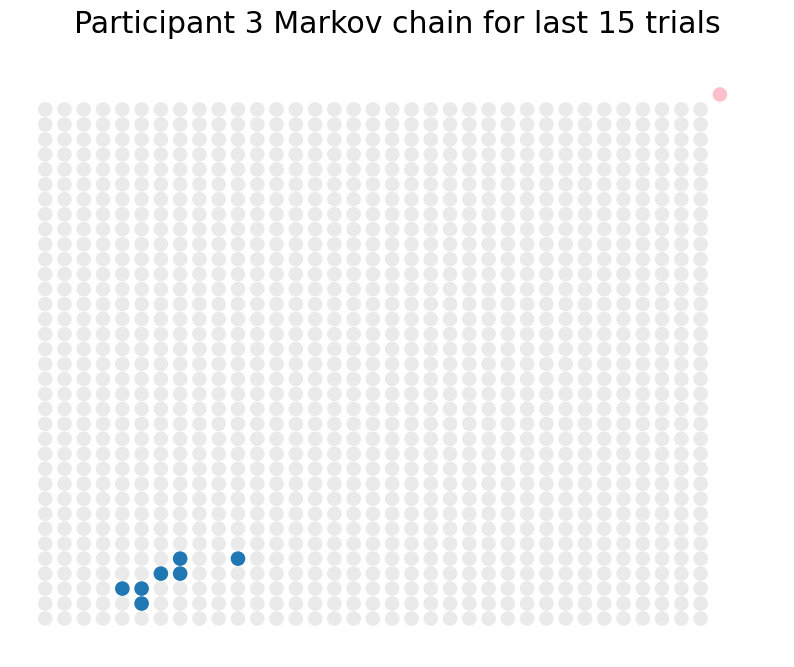

Subj num 3 name user_1642085813929
Number of states visited for last 15 trials: 7
Average state probability for last 15 trials: 2.142857142857143


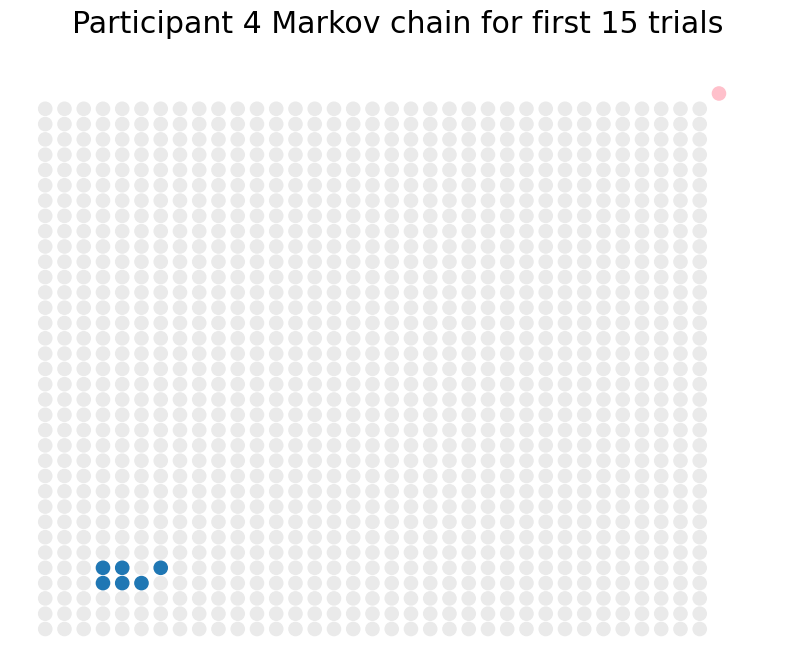

Subj num 4 name user_1642085816080
Number of states visited for first 15 trials: 6
Average state probability for first 15 trials: 2.5


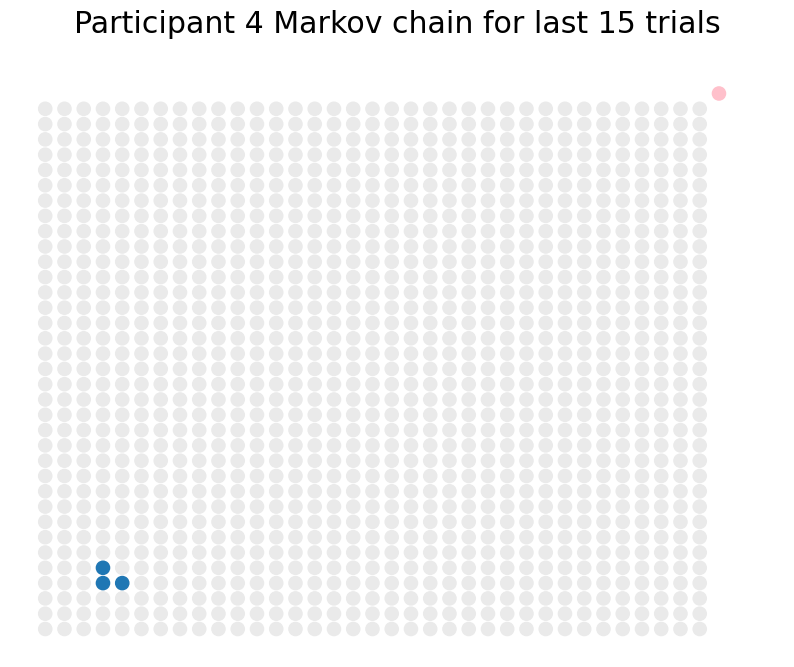

Subj num 4 name user_1642085816080
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


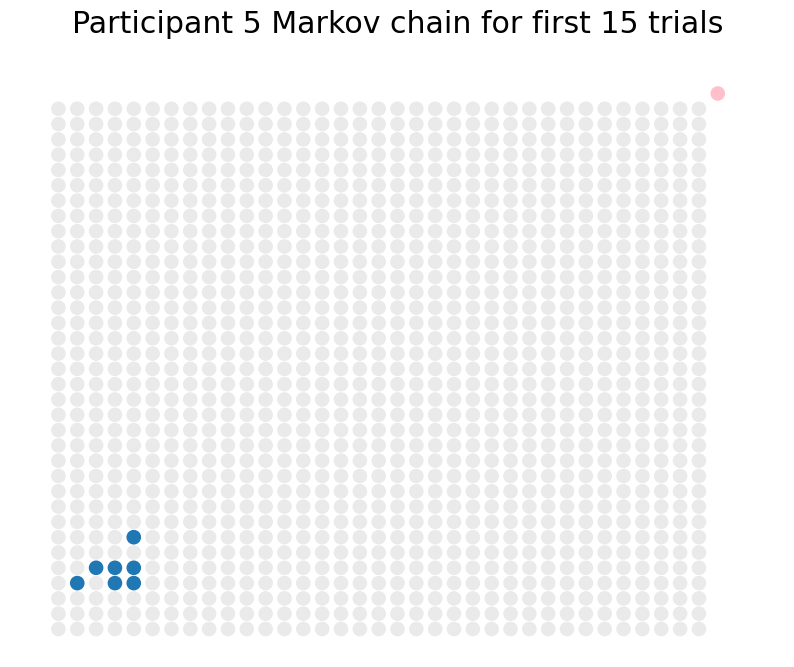

Subj num 5 name user_1642086005858
Number of states visited for first 15 trials: 7
Average state probability for first 15 trials: 2.142857142857143


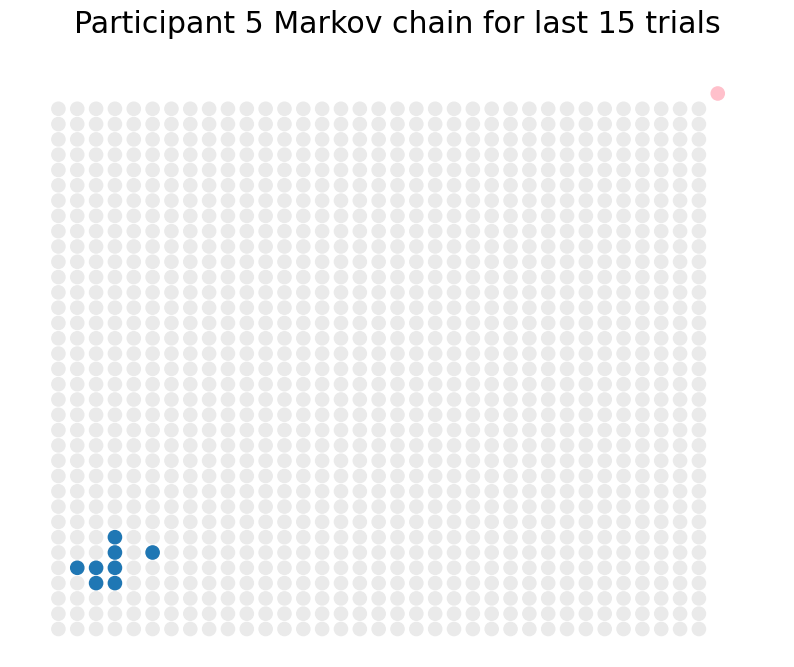

Subj num 5 name user_1642086005858
Number of states visited for last 15 trials: 8
Average state probability for last 15 trials: 1.875


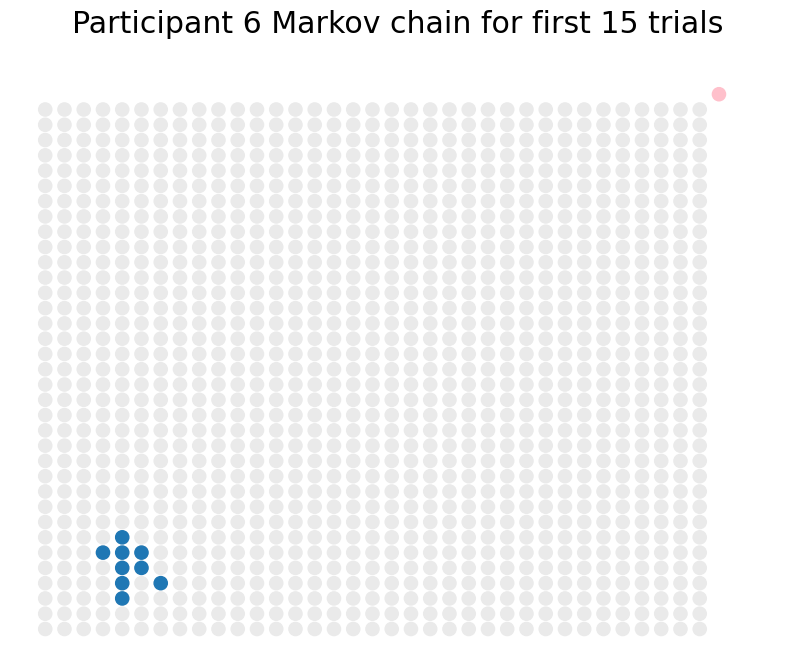

Subj num 6 name user_1642085868996
Number of states visited for first 15 trials: 9
Average state probability for first 15 trials: 1.6666666666666667


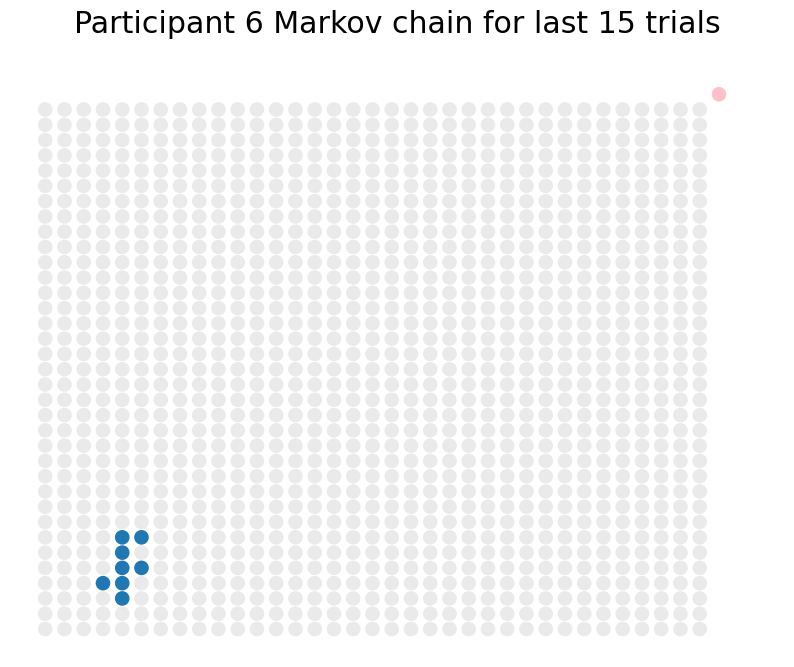

Subj num 6 name user_1642085868996
Number of states visited for last 15 trials: 8
Average state probability for last 15 trials: 1.875


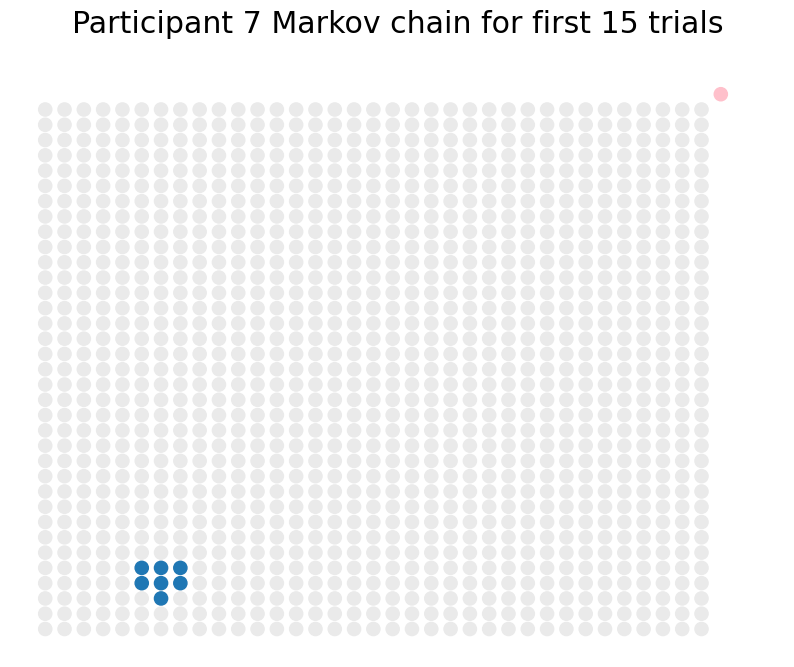

Subj num 7 name user_1642086140805
Number of states visited for first 15 trials: 7
Average state probability for first 15 trials: 2.142857142857143


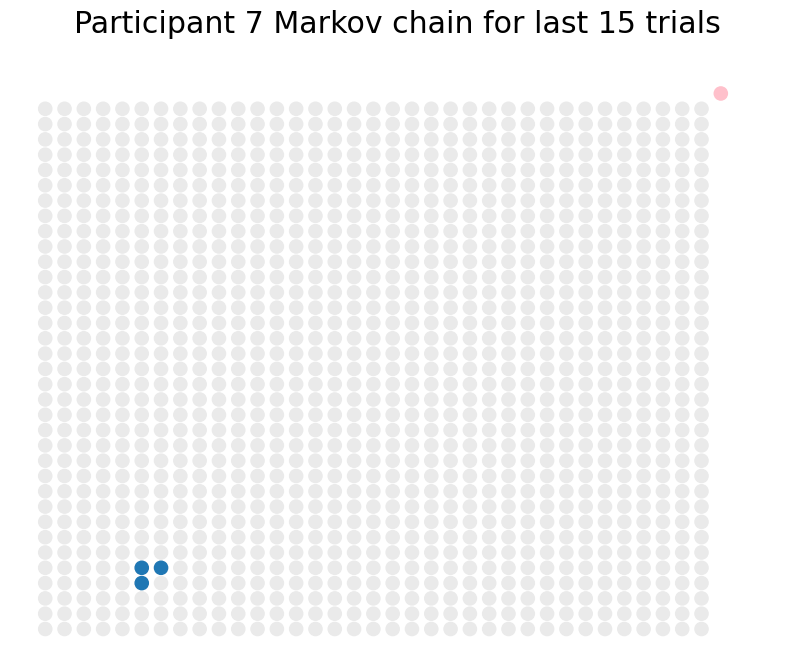

Subj num 7 name user_1642086140805
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


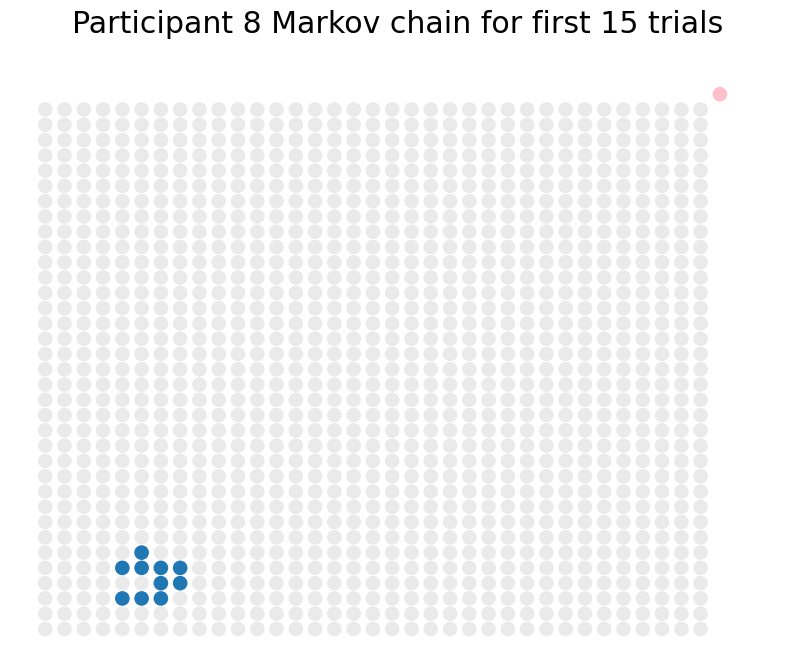

Subj num 8 name user_1642086047700
Number of states visited for first 15 trials: 10
Average state probability for first 15 trials: 1.5


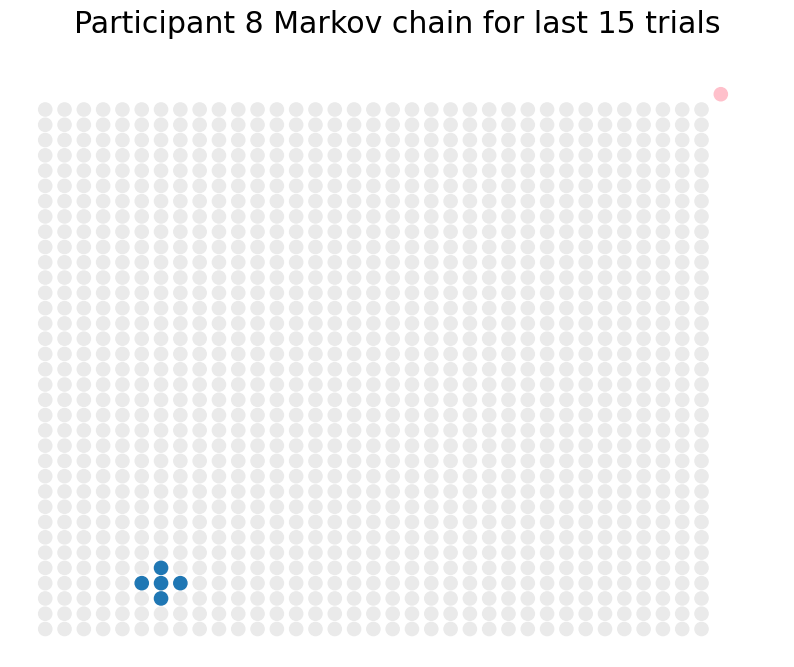

Subj num 8 name user_1642086047700
Number of states visited for last 15 trials: 5
Average state probability for last 15 trials: 3.0


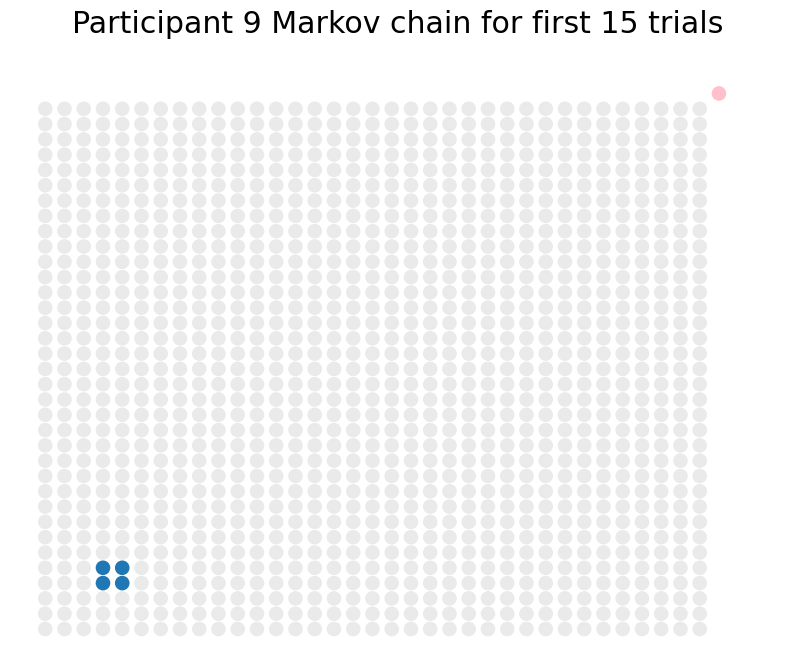

Subj num 9 name user_1642086297548
Number of states visited for first 15 trials: 4
Average state probability for first 15 trials: 3.75


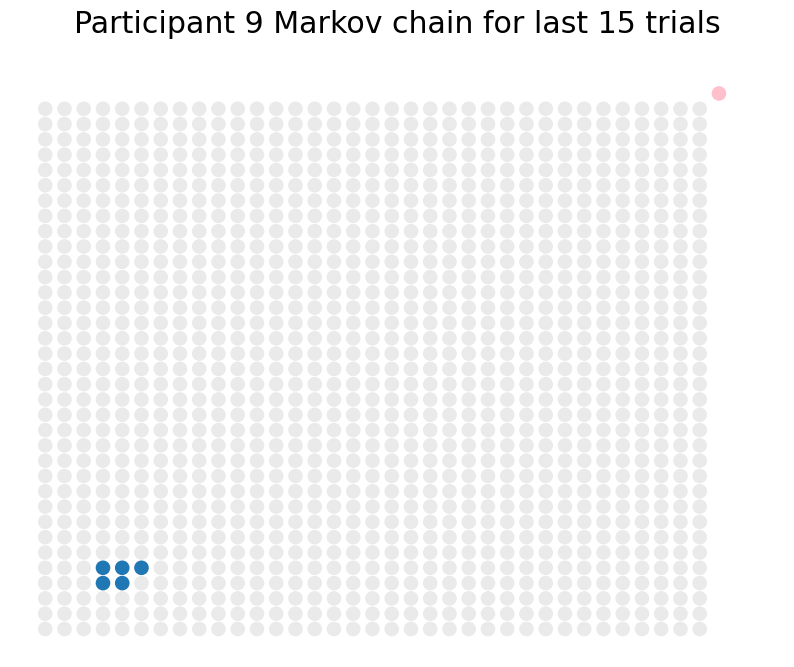

Subj num 9 name user_1642086297548
Number of states visited for last 15 trials: 5
Average state probability for last 15 trials: 3.0


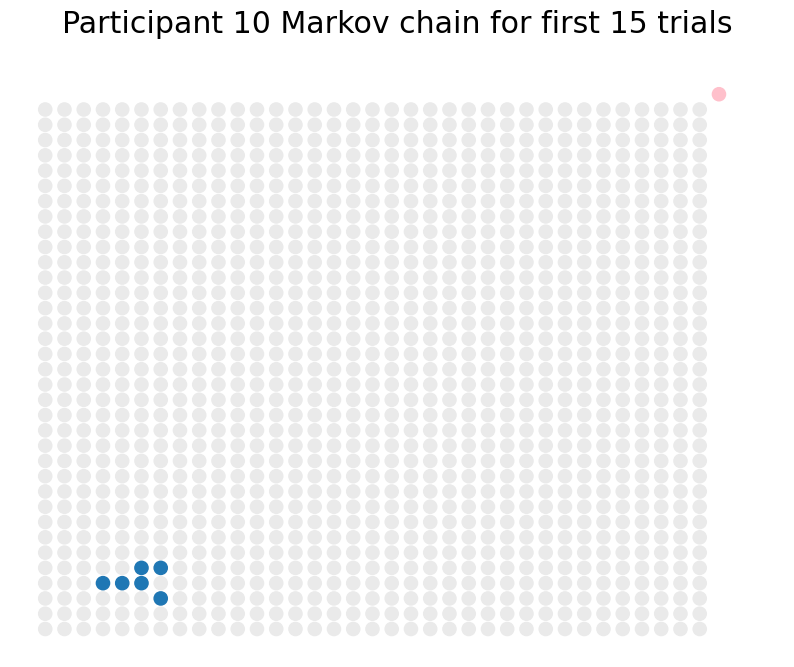

Subj num 10 name user_1642086488531
Number of states visited for first 15 trials: 6
Average state probability for first 15 trials: 2.5


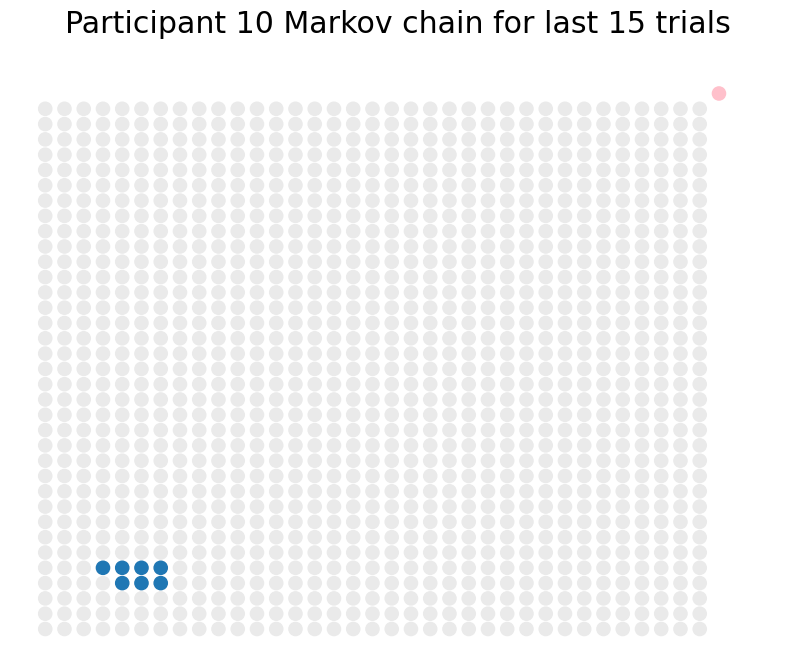

Subj num 10 name user_1642086488531
Number of states visited for last 15 trials: 7
Average state probability for last 15 trials: 2.142857142857143


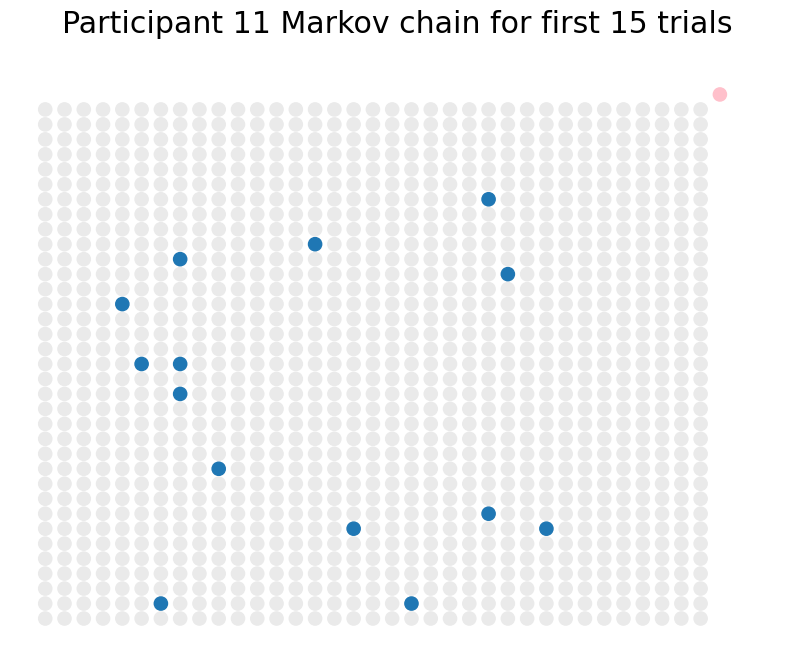

Subj num 11 name user_1642086439976
Number of states visited for first 15 trials: 14
Average state probability for first 15 trials: 1.0714285714285714


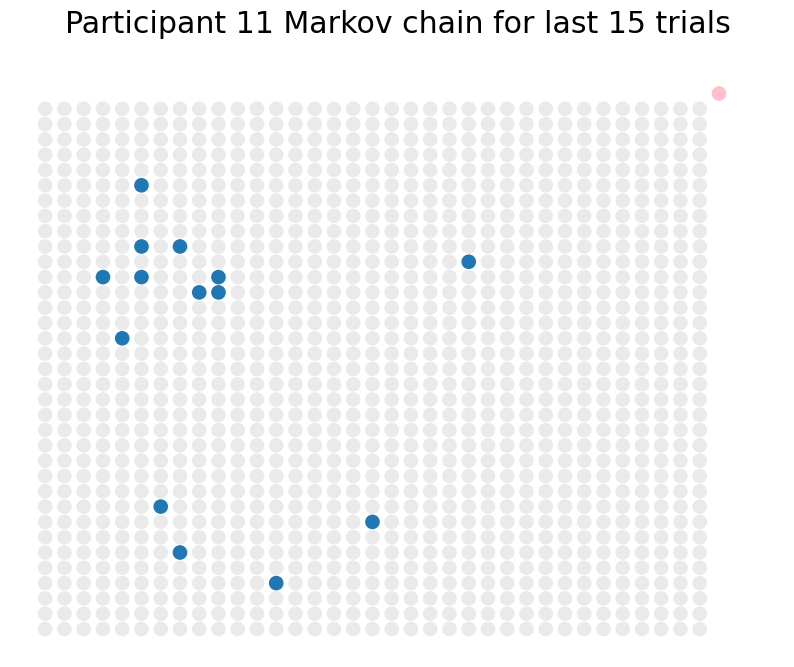

Subj num 11 name user_1642086439976
Number of states visited for last 15 trials: 14
Average state probability for last 15 trials: 1.0714285714285714


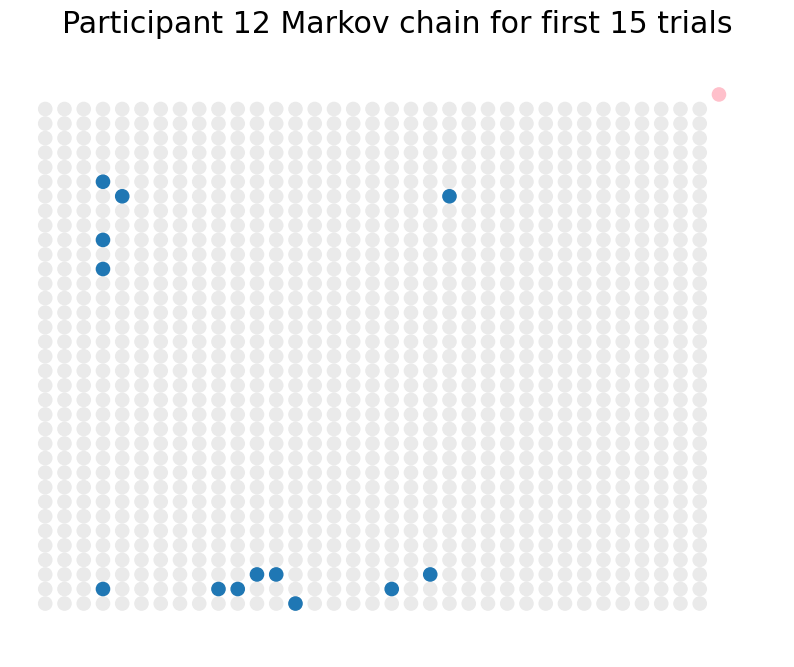

Subj num 12 name user_1642086496014
Number of states visited for first 15 trials: 13
Average state probability for first 15 trials: 1.0769230769230769


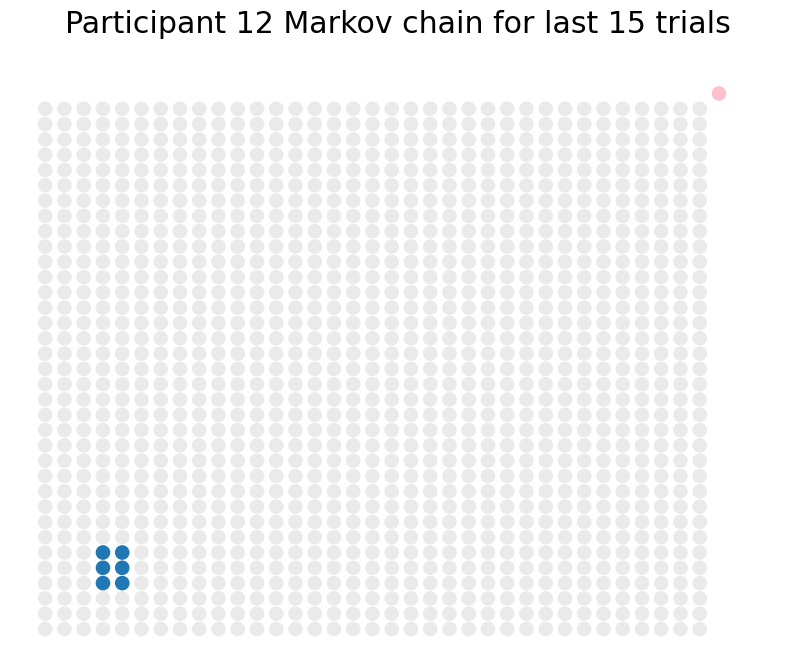

Subj num 12 name user_1642086496014
Number of states visited for last 15 trials: 6
Average state probability for last 15 trials: 2.5


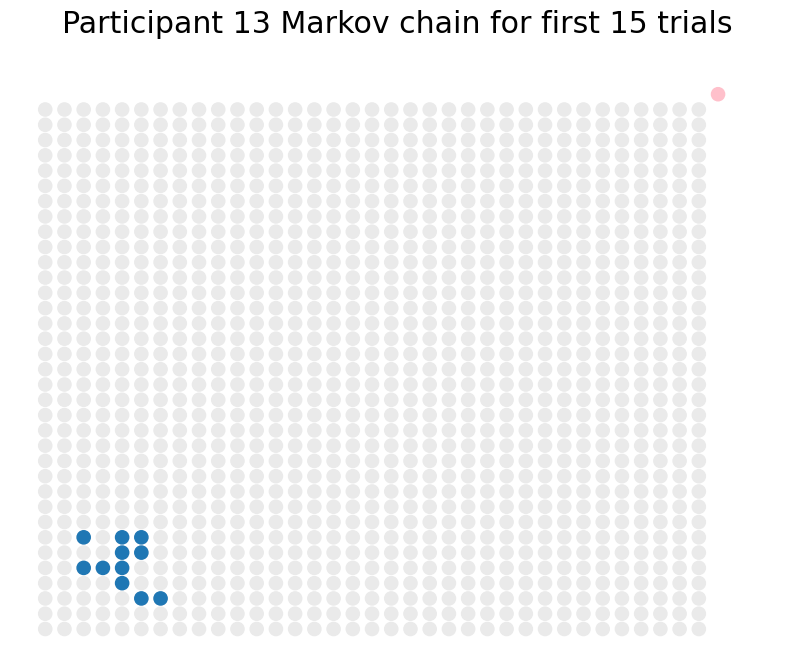

Subj num 13 name user_1642086370927
Number of states visited for first 15 trials: 11
Average state probability for first 15 trials: 1.3636363636363635


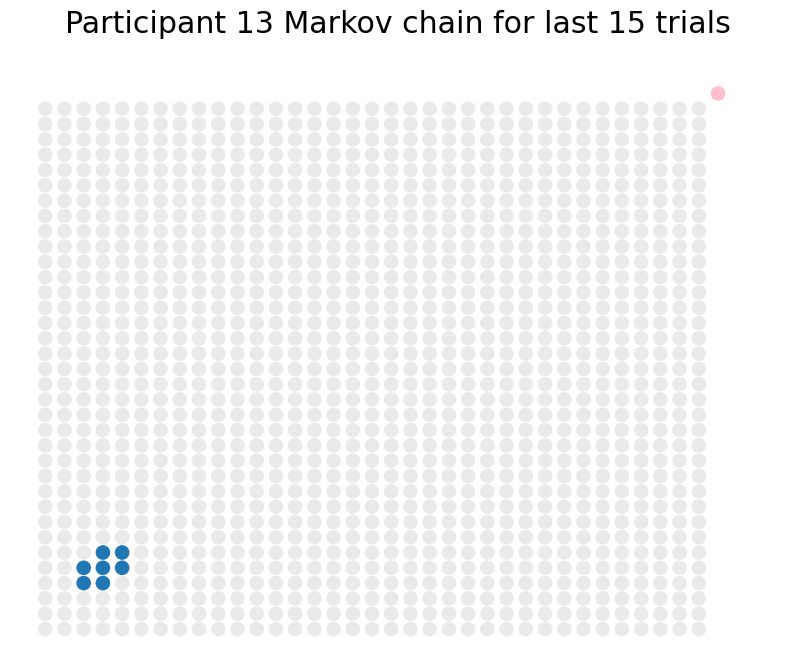

Subj num 13 name user_1642086370927
Number of states visited for last 15 trials: 7
Average state probability for last 15 trials: 2.142857142857143


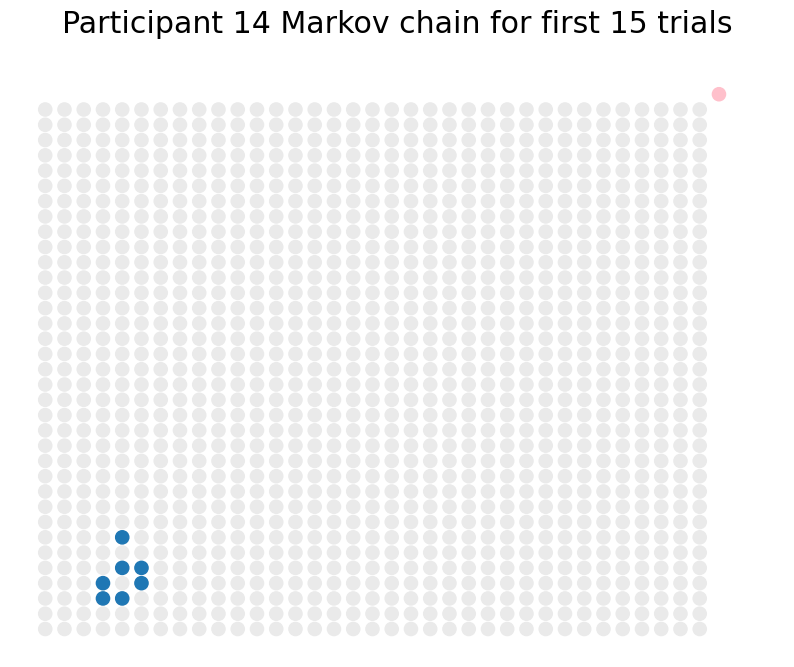

Subj num 14 name user_1642086945465
Number of states visited for first 15 trials: 7
Average state probability for first 15 trials: 2.142857142857143


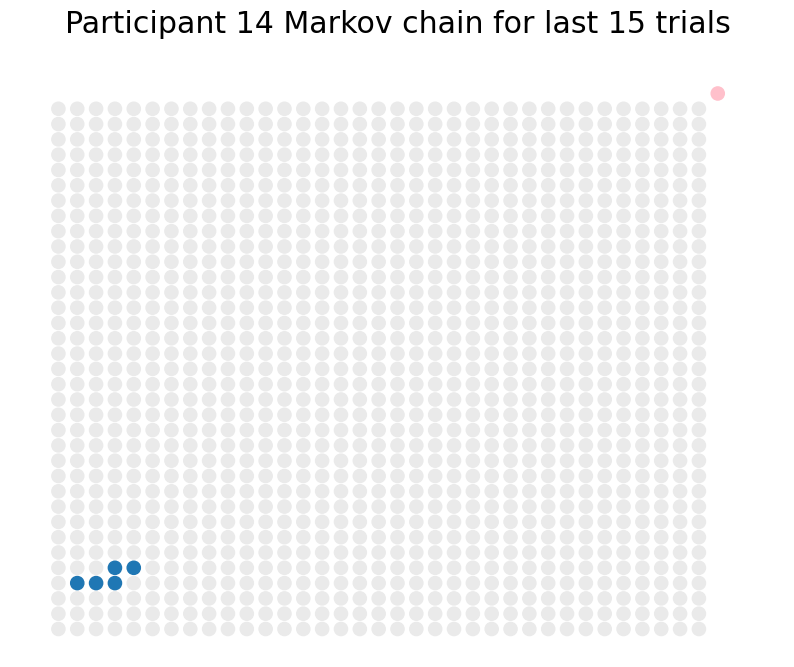

Subj num 14 name user_1642086945465
Number of states visited for last 15 trials: 5
Average state probability for last 15 trials: 3.0


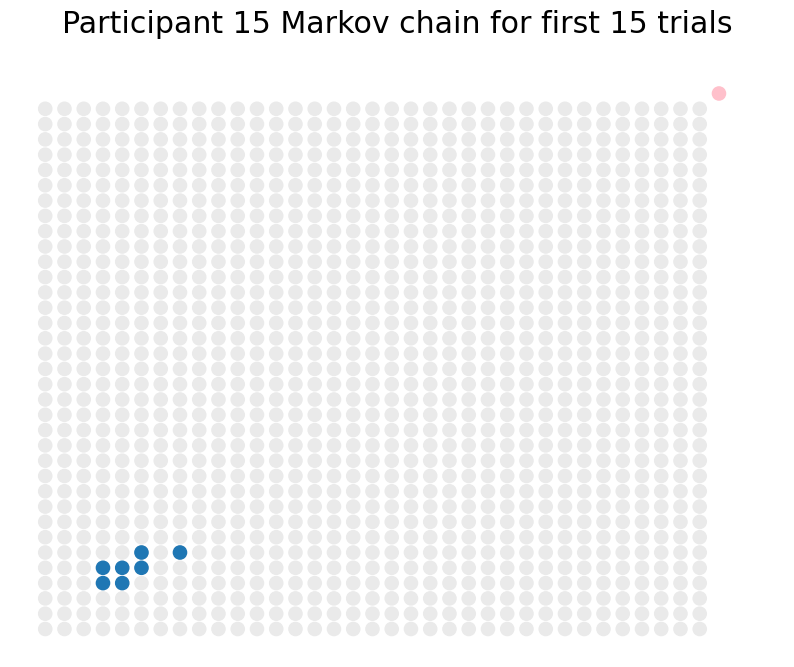

Subj num 15 name user_1642086528831
Number of states visited for first 15 trials: 7
Average state probability for first 15 trials: 2.142857142857143


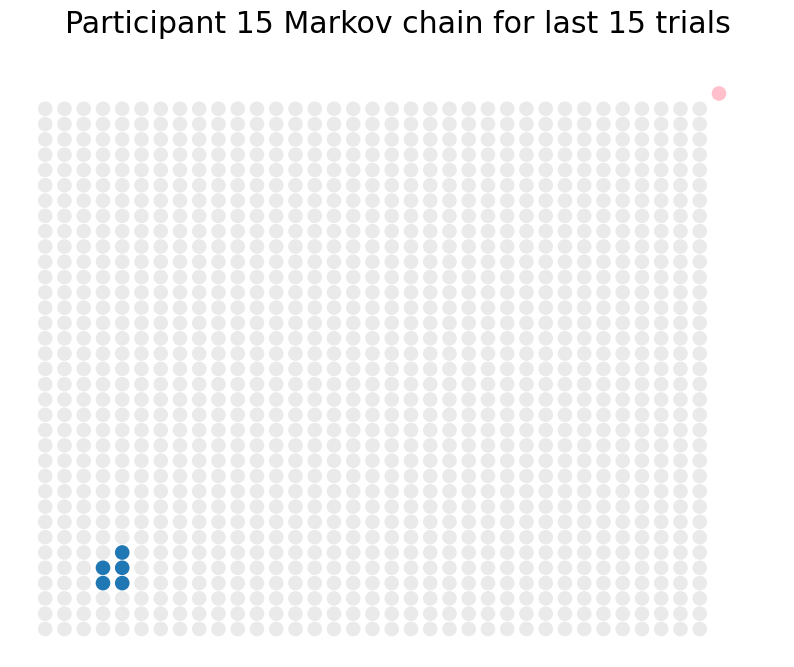

Subj num 15 name user_1642086528831
Number of states visited for last 15 trials: 5
Average state probability for last 15 trials: 3.0


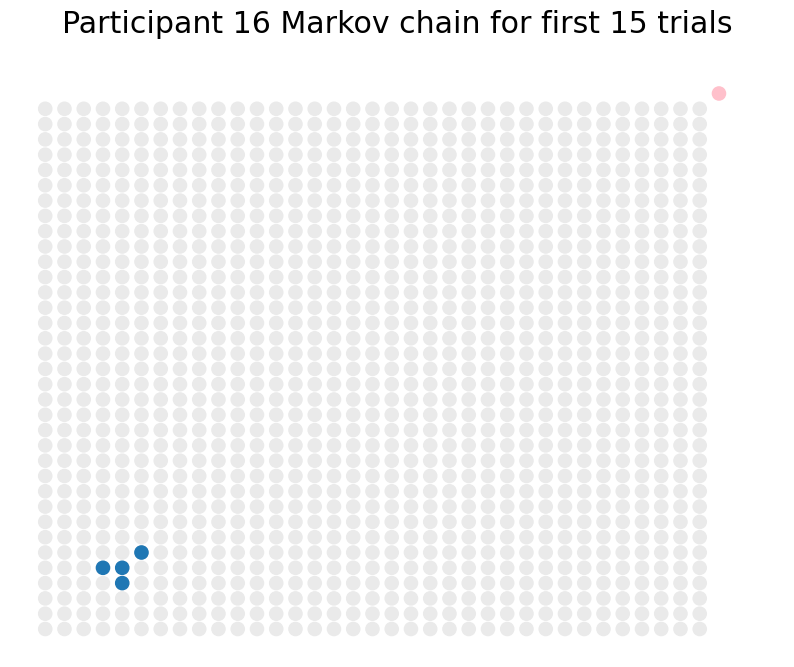

Subj num 16 name user_1642087318654
Number of states visited for first 15 trials: 4
Average state probability for first 15 trials: 3.75


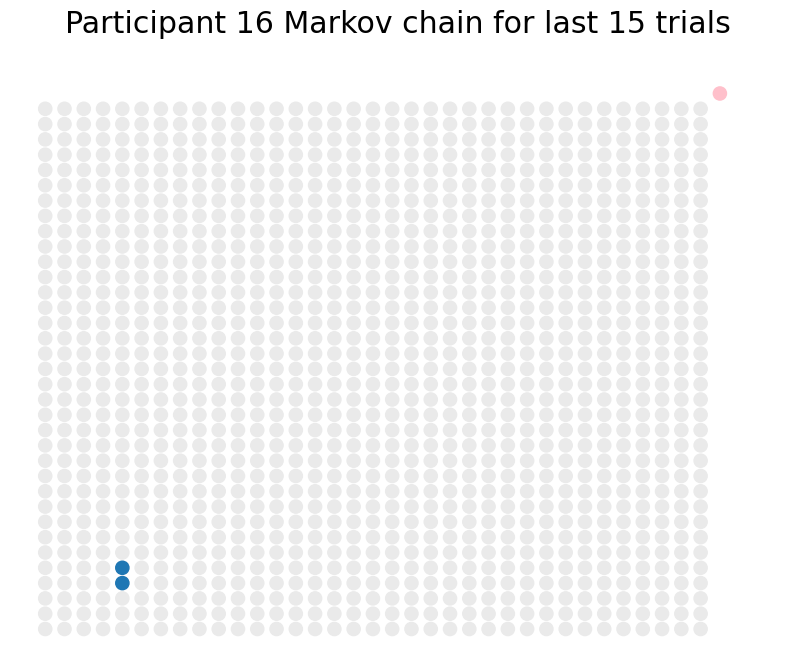

Subj num 16 name user_1642087318654
Number of states visited for last 15 trials: 2
Average state probability for last 15 trials: 7.5


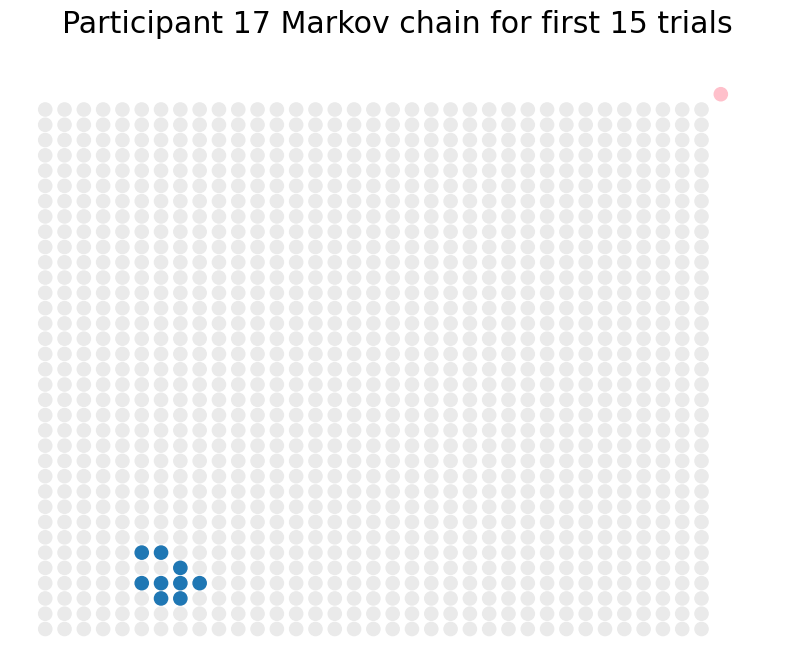

Subj num 17 name user_1642087749554
Number of states visited for first 15 trials: 9
Average state probability for first 15 trials: 1.6666666666666667


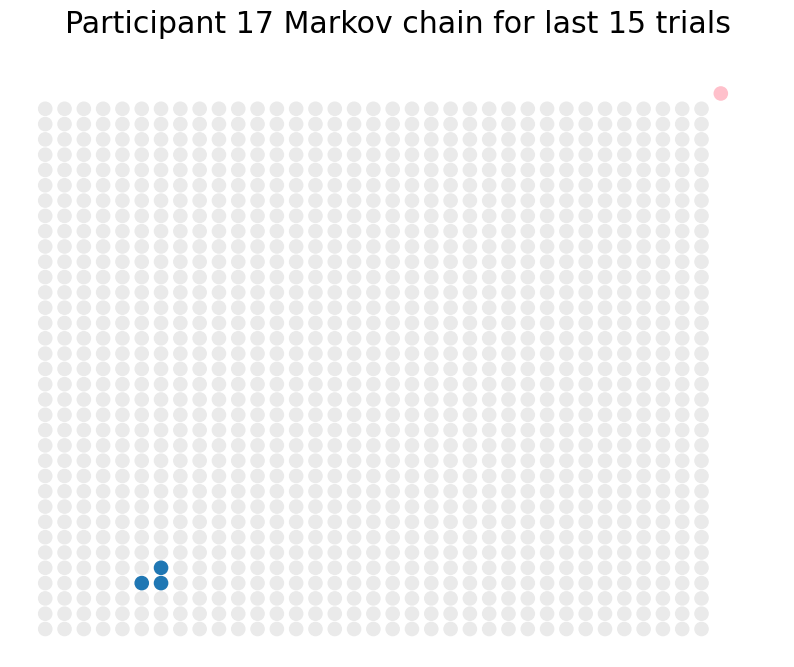

Subj num 17 name user_1642087749554
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


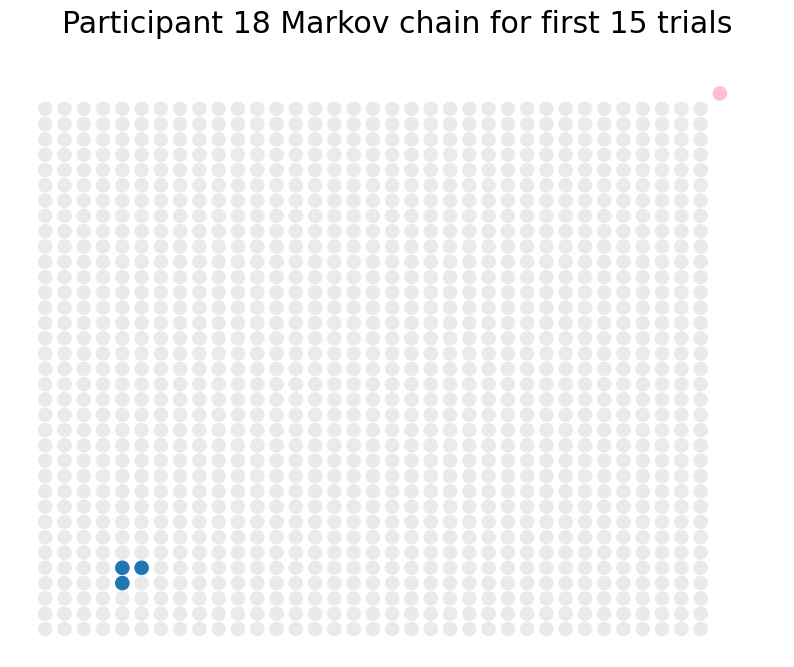

Subj num 18 name user_1642087086533
Number of states visited for first 15 trials: 3
Average state probability for first 15 trials: 5.0


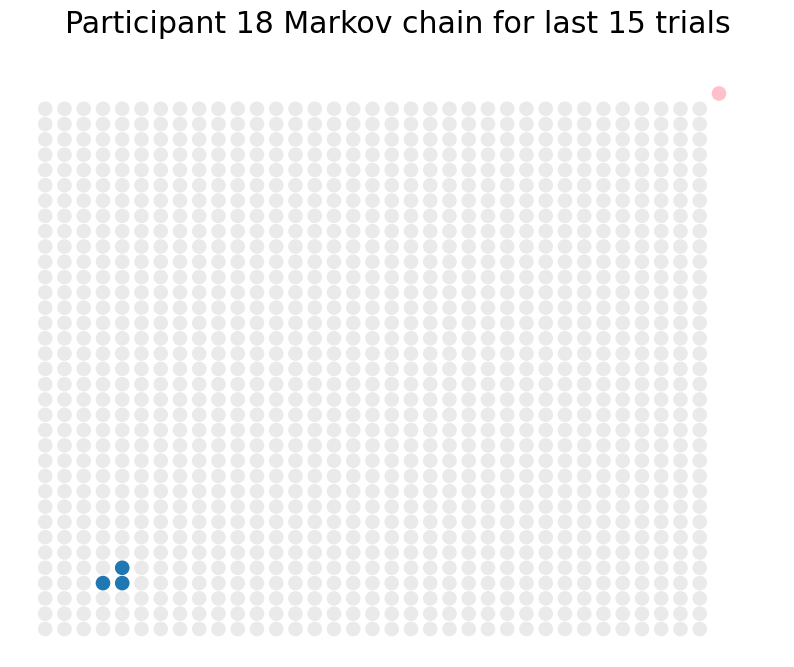

Subj num 18 name user_1642087086533
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


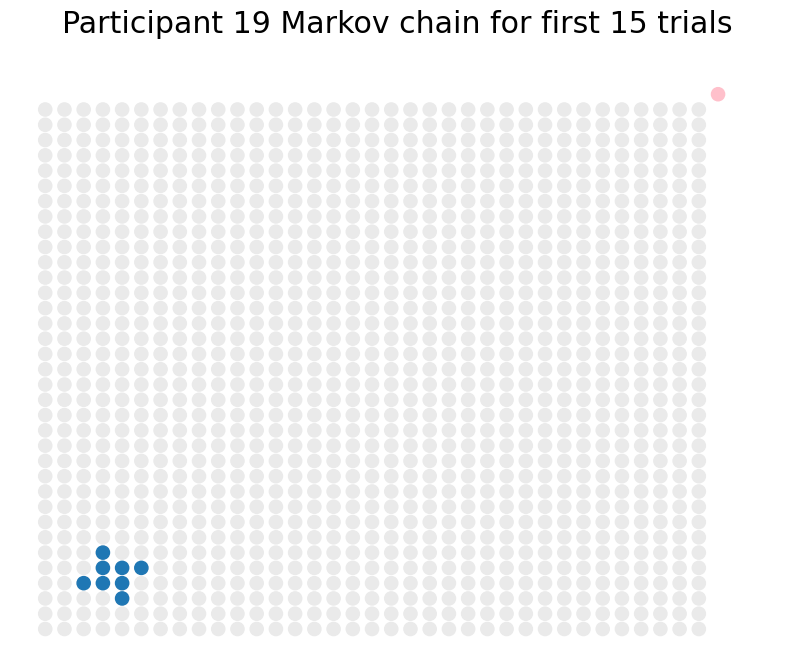

Subj num 19 name user_1642087834497
Number of states visited for first 15 trials: 8
Average state probability for first 15 trials: 1.875


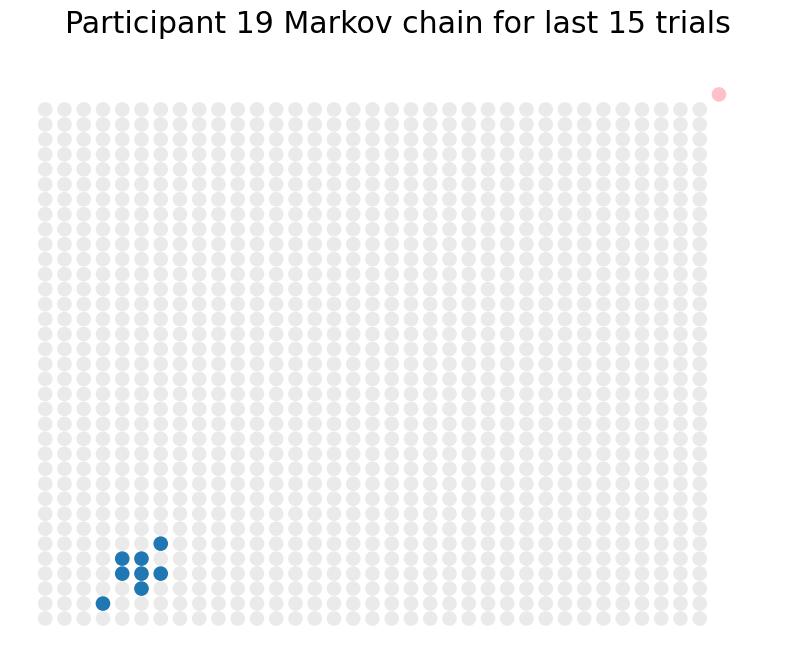

Subj num 19 name user_1642087834497
Number of states visited for last 15 trials: 8
Average state probability for last 15 trials: 1.875


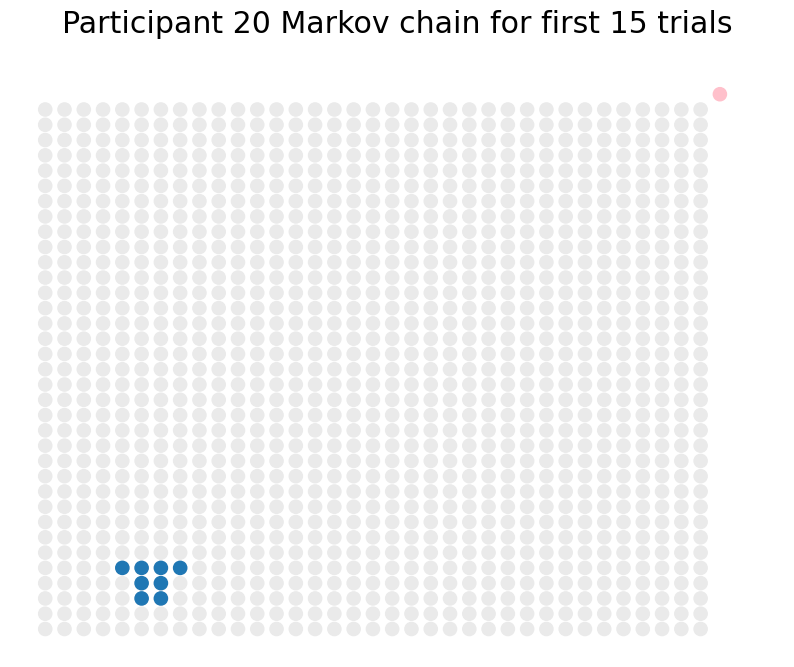

Subj num 20 name user_1642087778191
Number of states visited for first 15 trials: 8
Average state probability for first 15 trials: 1.875


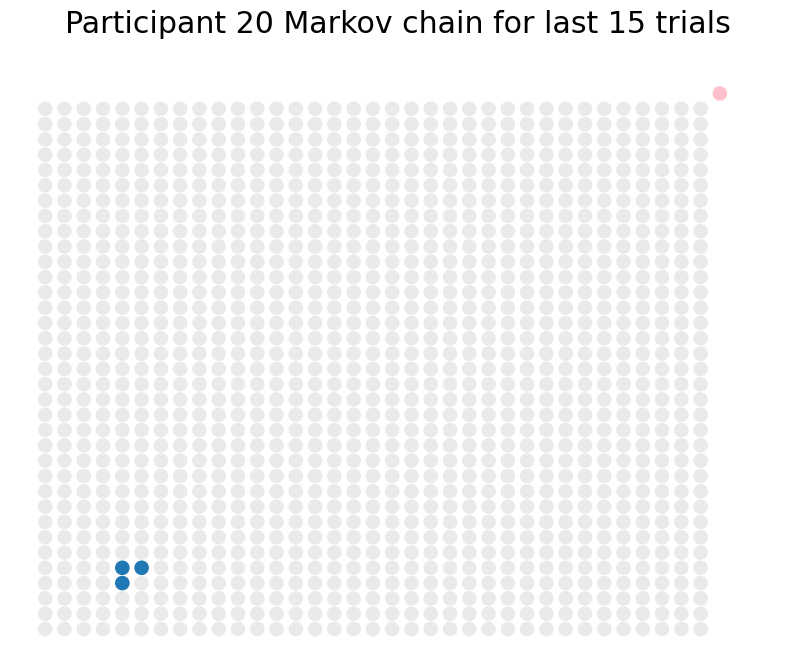

Subj num 20 name user_1642087778191
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


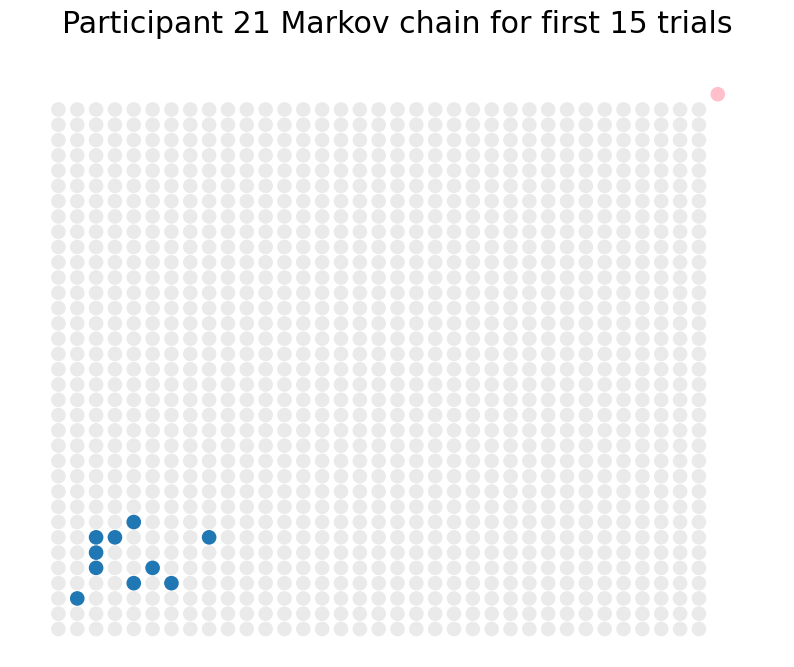

Subj num 21 name user_1642088018465
Number of states visited for first 15 trials: 10
Average state probability for first 15 trials: 1.4


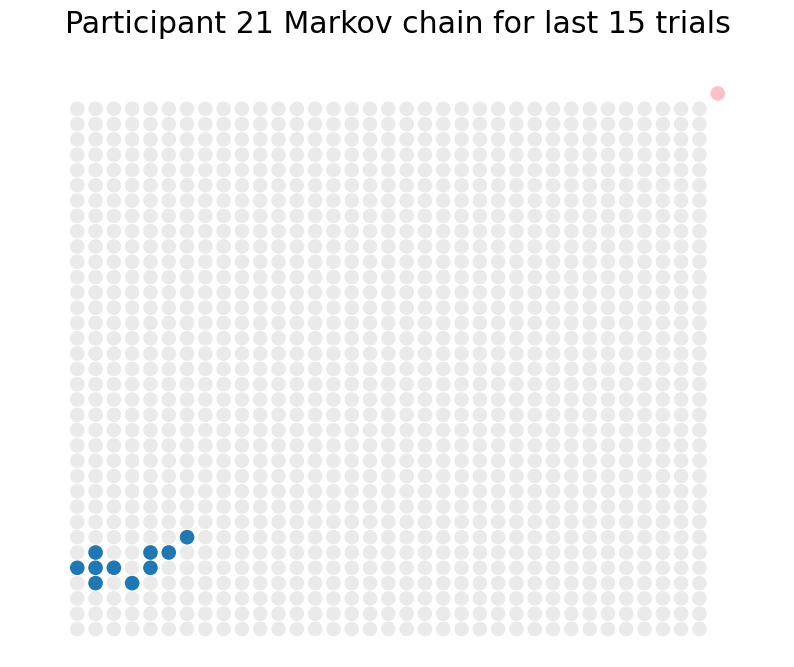

Subj num 21 name user_1642088018465
Number of states visited for last 15 trials: 10
Average state probability for last 15 trials: 1.4


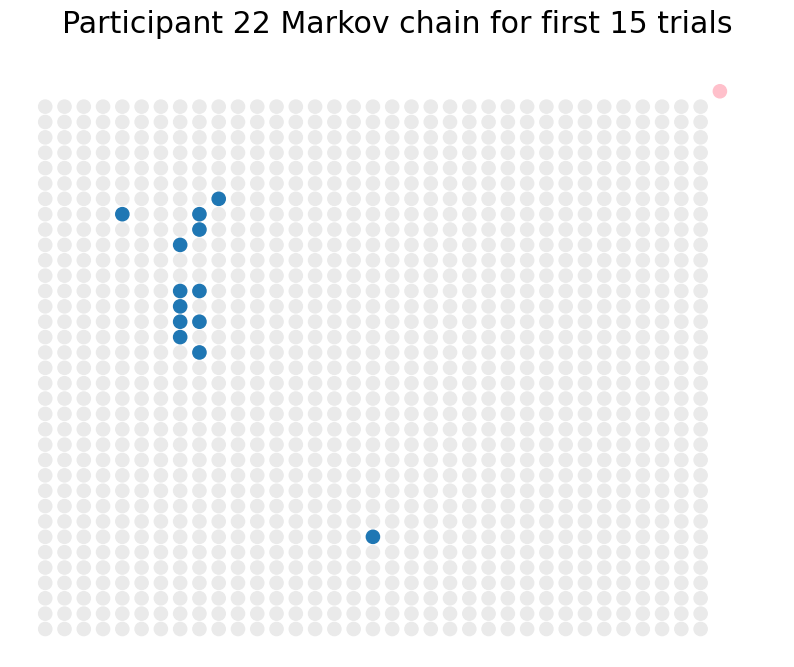

Subj num 22 name user_1642087926904
Number of states visited for first 15 trials: 13
Average state probability for first 15 trials: 1.1538461538461537


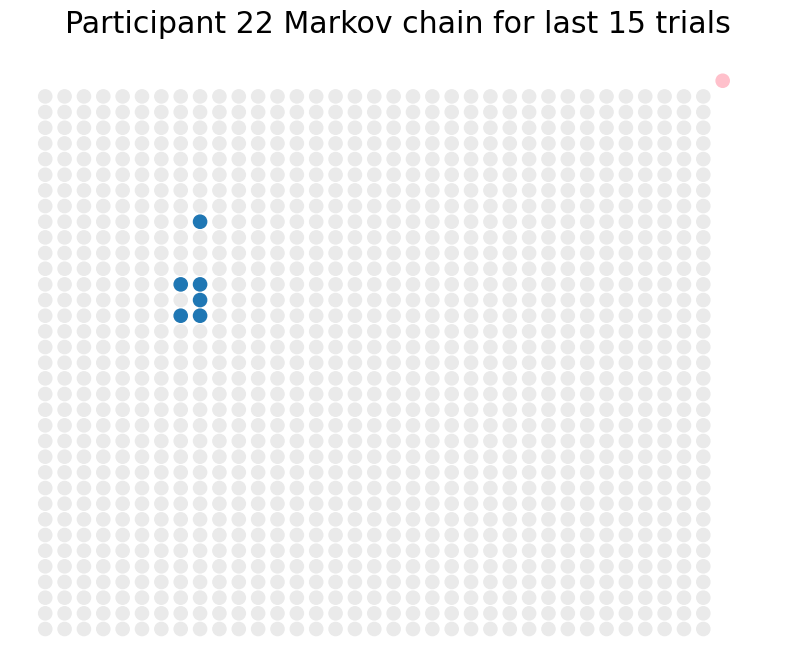

Subj num 22 name user_1642087926904
Number of states visited for last 15 trials: 6
Average state probability for last 15 trials: 2.5


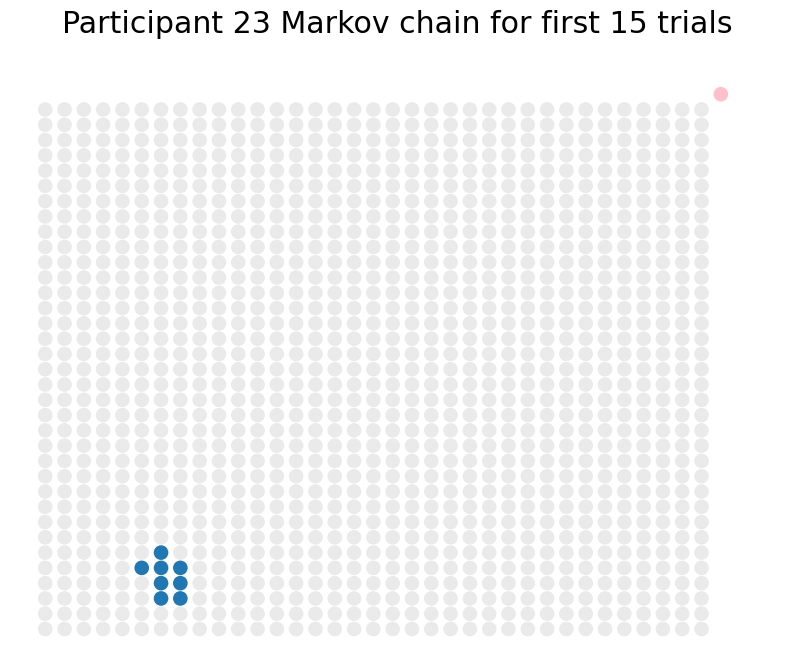

Subj num 23 name user_1642087982341
Number of states visited for first 15 trials: 8
Average state probability for first 15 trials: 1.875


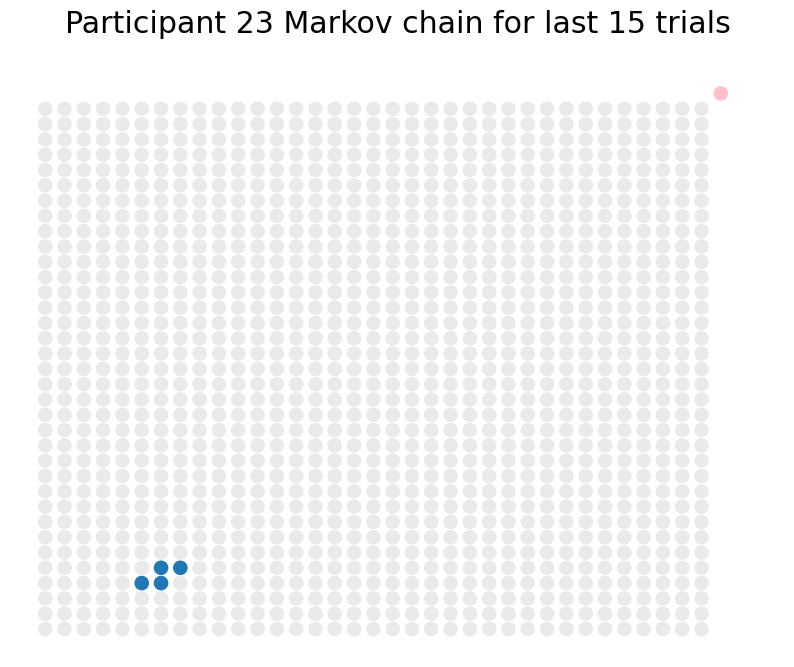

Subj num 23 name user_1642087982341
Number of states visited for last 15 trials: 4
Average state probability for last 15 trials: 3.75


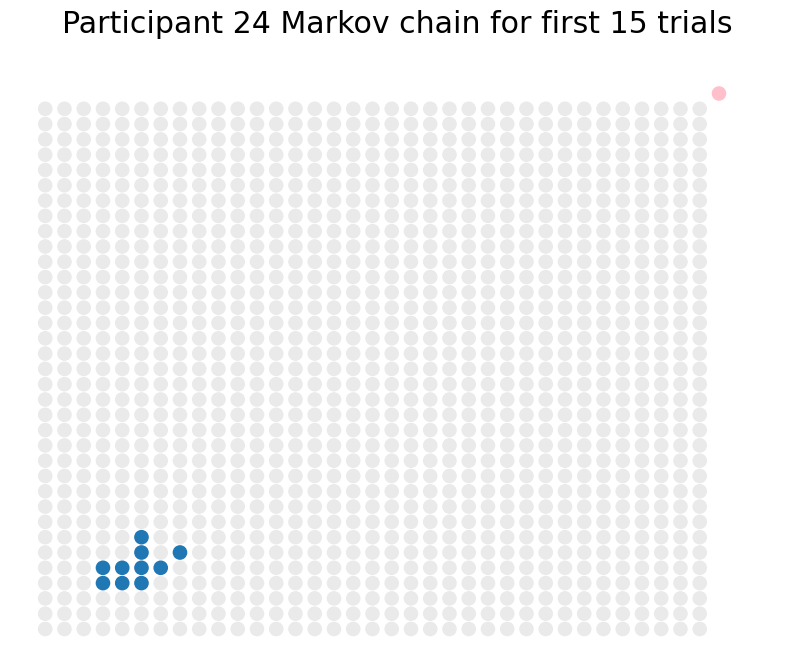

Subj num 24 name user_1642088448345
Number of states visited for first 15 trials: 10
Average state probability for first 15 trials: 1.5


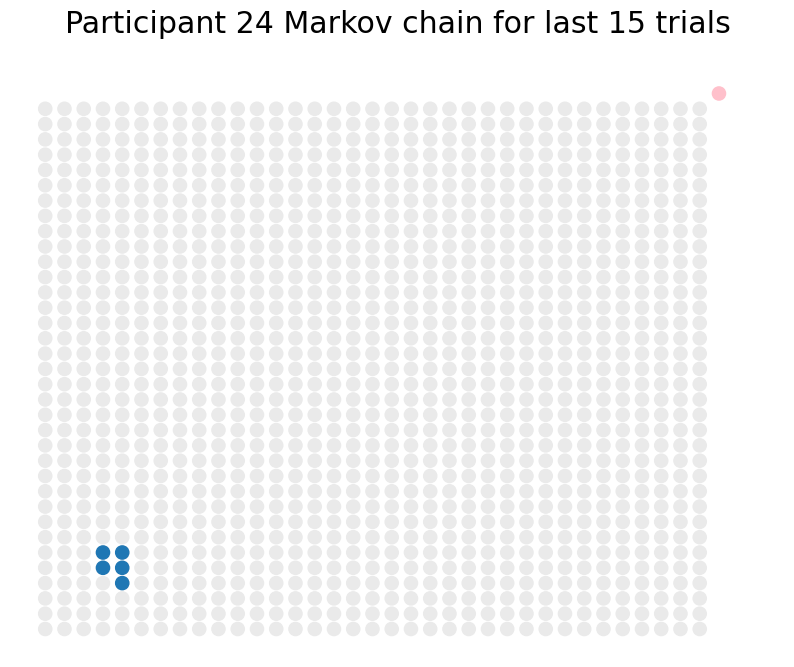

Subj num 24 name user_1642088448345
Number of states visited for last 15 trials: 5
Average state probability for last 15 trials: 3.0


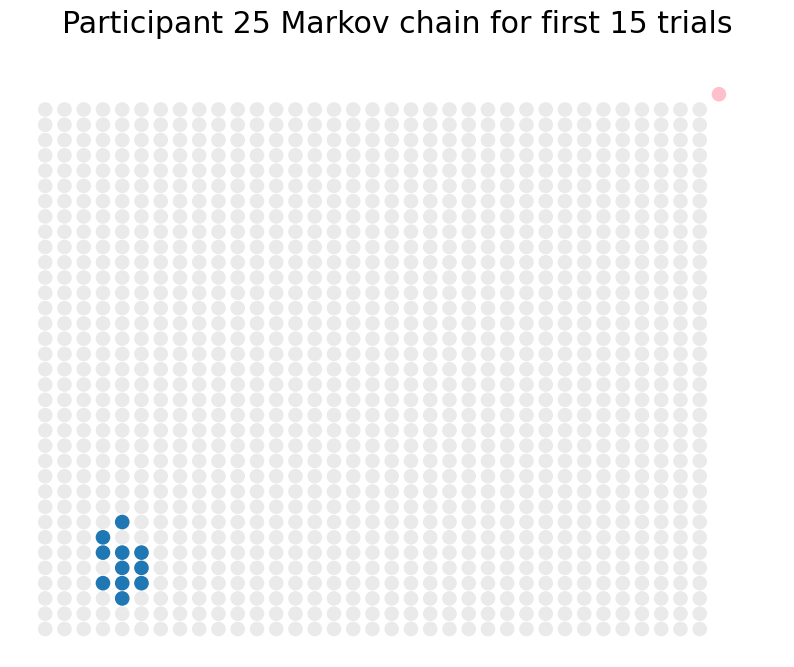

Subj num 25 name user_1642088393763
Number of states visited for first 15 trials: 11
Average state probability for first 15 trials: 1.3636363636363635


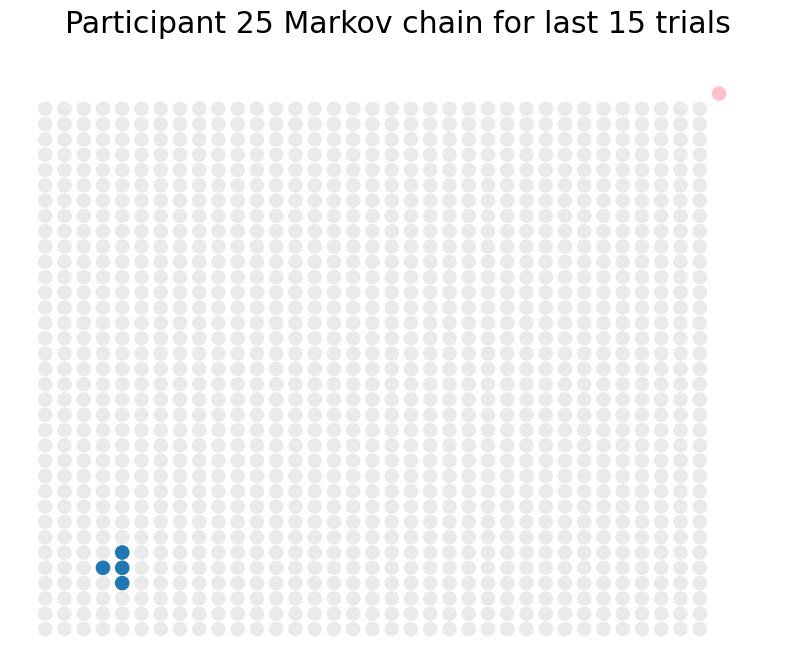

Subj num 25 name user_1642088393763
Number of states visited for last 15 trials: 4
Average state probability for last 15 trials: 3.75


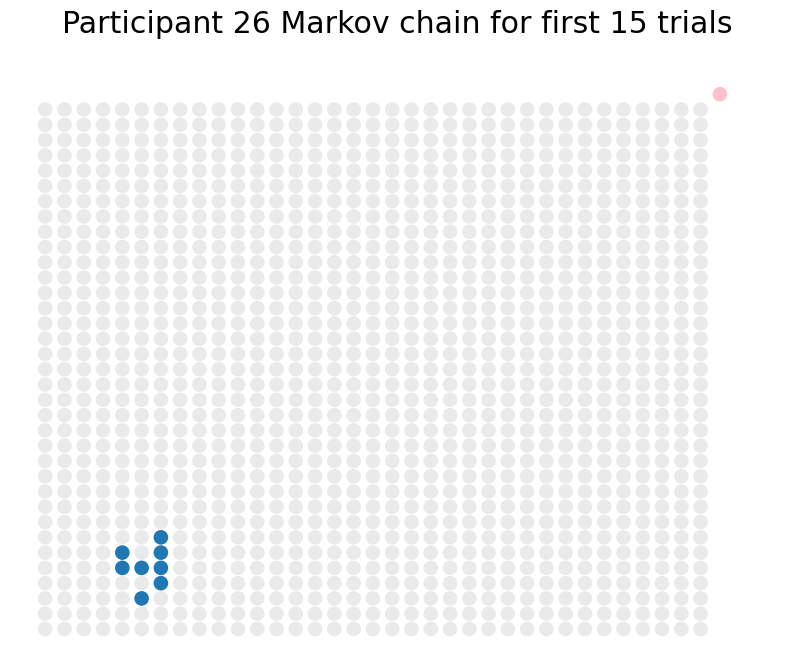

Subj num 26 name user_1642088999512
Number of states visited for first 15 trials: 8
Average state probability for first 15 trials: 1.875


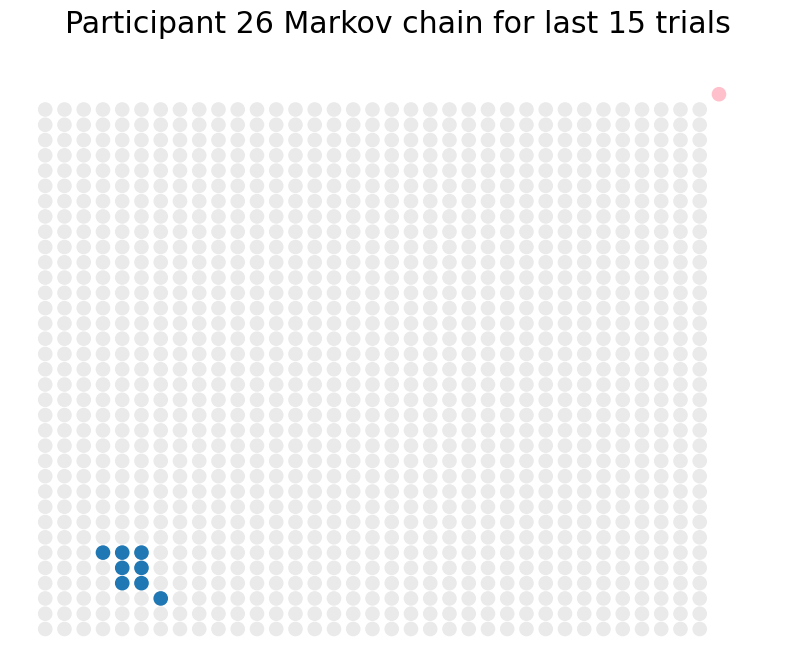

Subj num 26 name user_1642088999512
Number of states visited for last 15 trials: 8
Average state probability for last 15 trials: 1.875


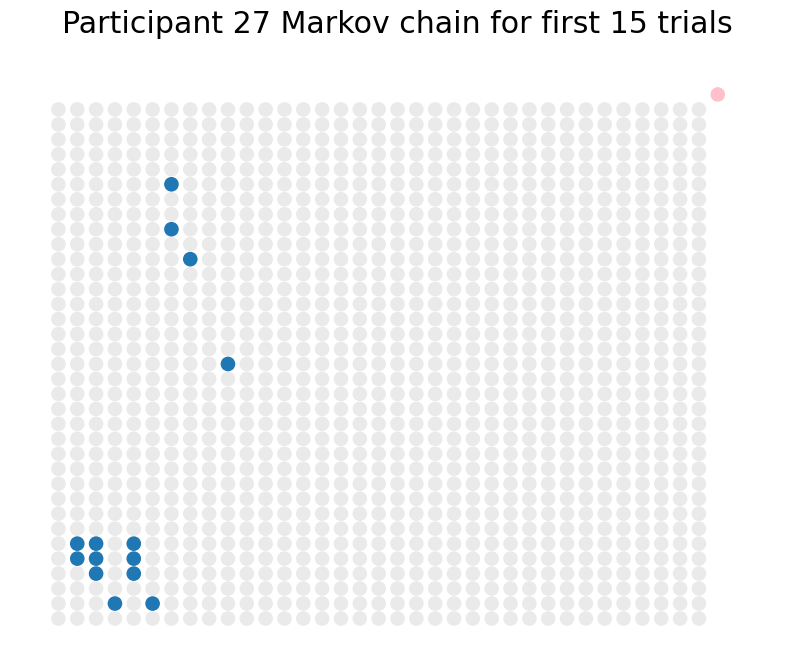

Subj num 27 name user_1642089220816
Number of states visited for first 15 trials: 14
Average state probability for first 15 trials: 1.0714285714285714


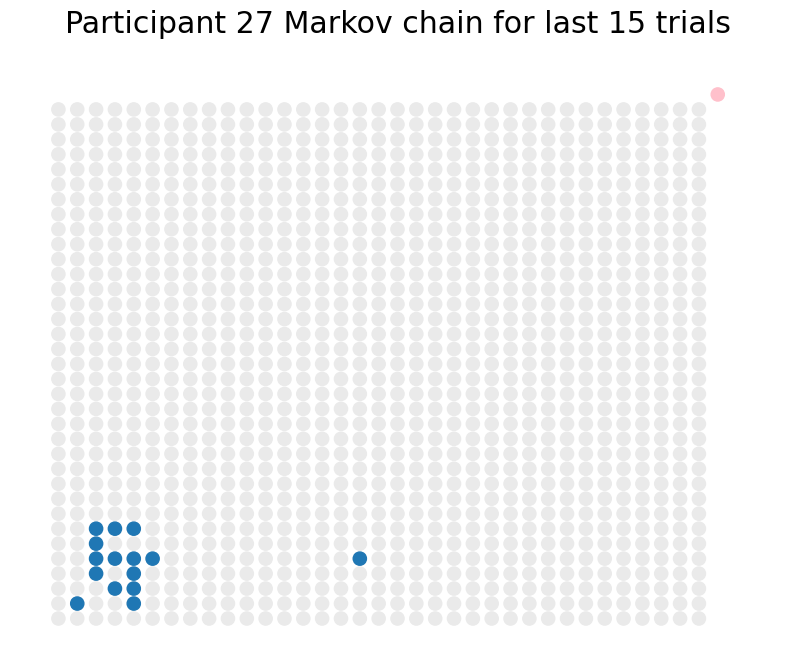

Subj num 27 name user_1642089220816
Number of states visited for last 15 trials: 15
Average state probability for last 15 trials: 1.0


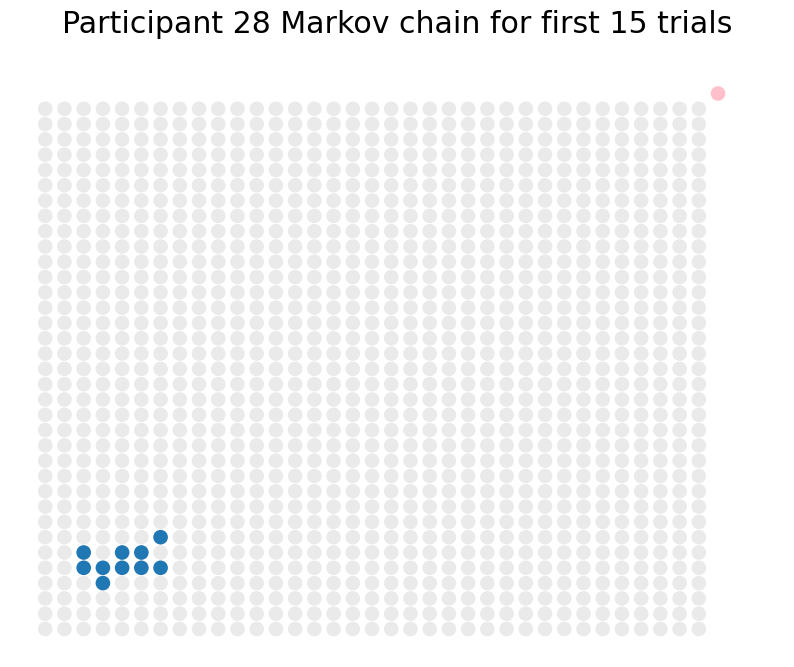

Subj num 28 name user_1642089304255
Number of states visited for first 15 trials: 10
Average state probability for first 15 trials: 1.5


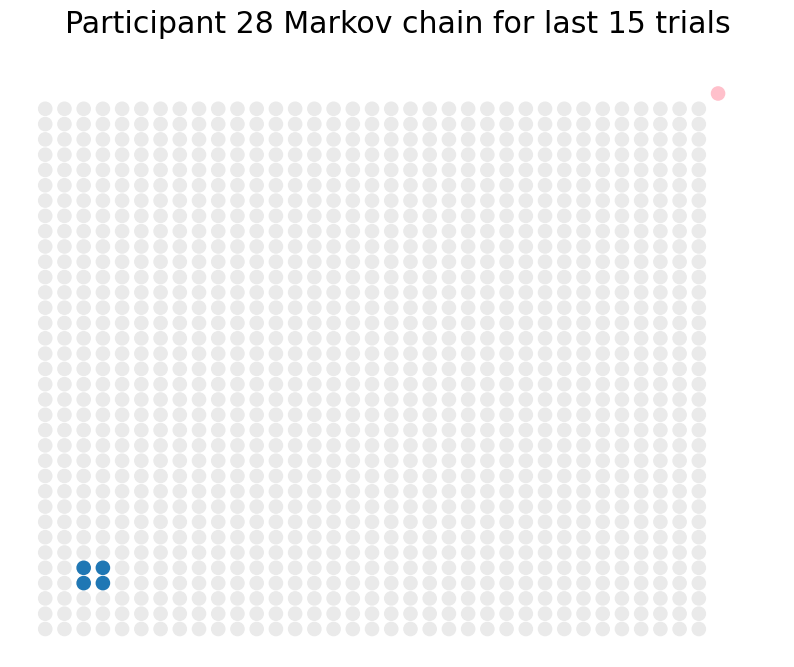

Subj num 28 name user_1642089304255
Number of states visited for last 15 trials: 4
Average state probability for last 15 trials: 3.75


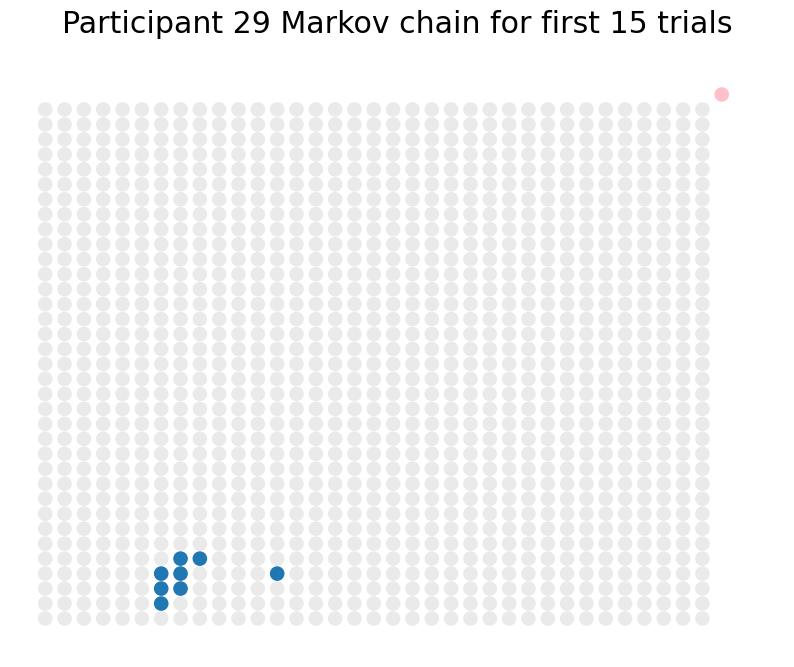

Subj num 29 name user_1642089327840
Number of states visited for first 15 trials: 8
Average state probability for first 15 trials: 1.875


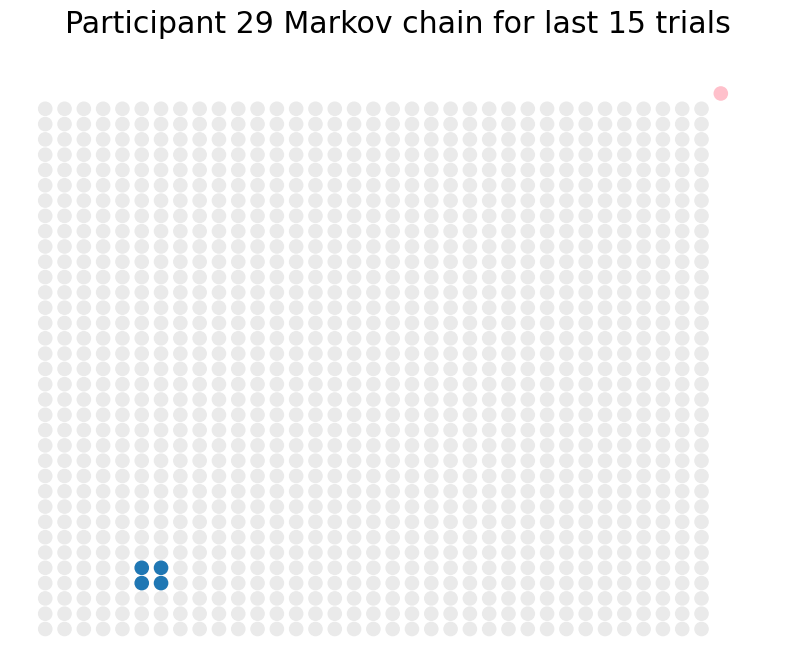

Subj num 29 name user_1642089327840
Number of states visited for last 15 trials: 4
Average state probability for last 15 trials: 3.75


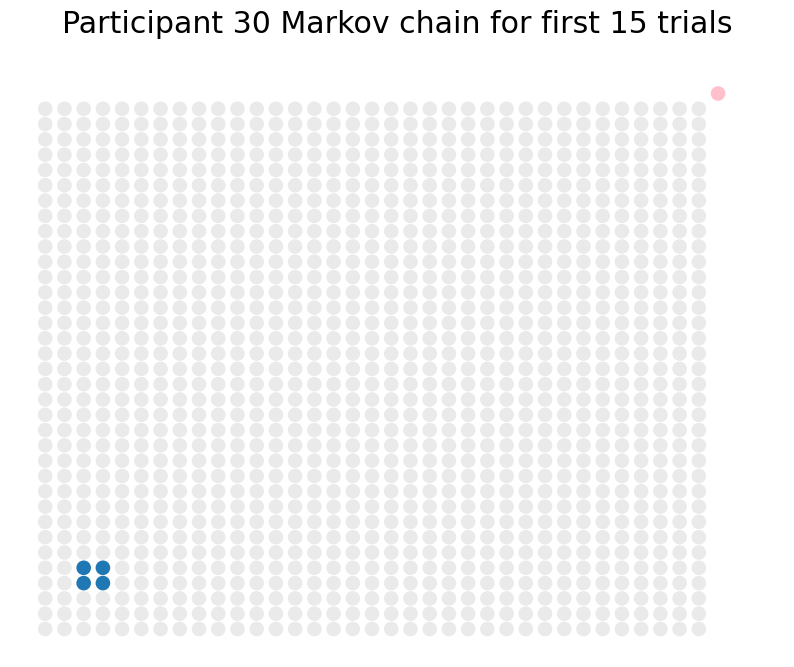

Subj num 30 name user_1642089880207
Number of states visited for first 15 trials: 4
Average state probability for first 15 trials: 3.75


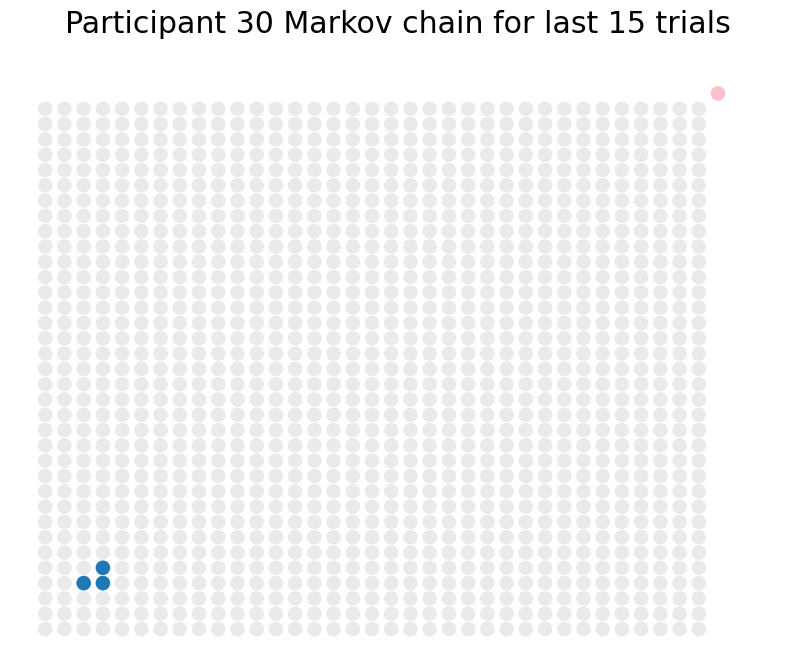

Subj num 30 name user_1642089880207
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


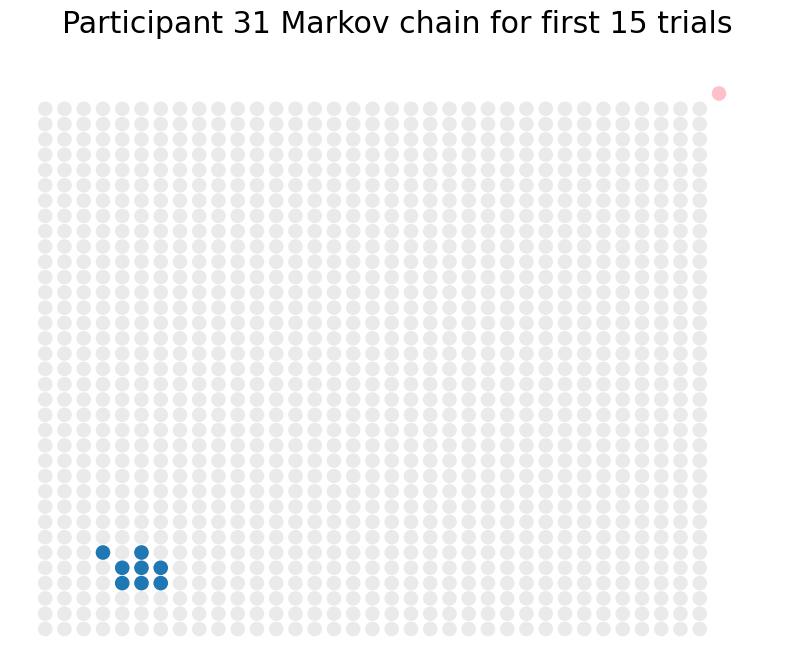

Subj num 31 name user_1642089836924
Number of states visited for first 15 trials: 8
Average state probability for first 15 trials: 1.875


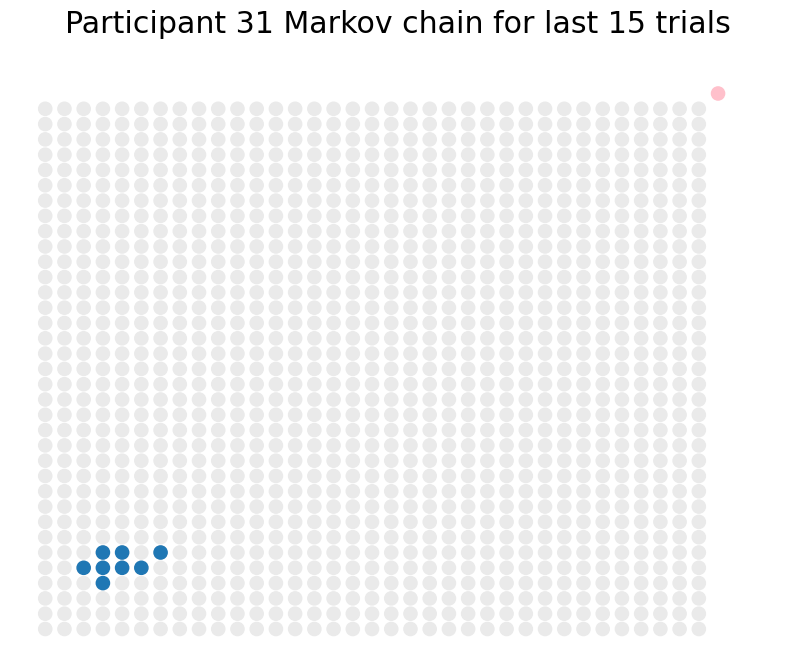

Subj num 31 name user_1642089836924
Number of states visited for last 15 trials: 8
Average state probability for last 15 trials: 1.875


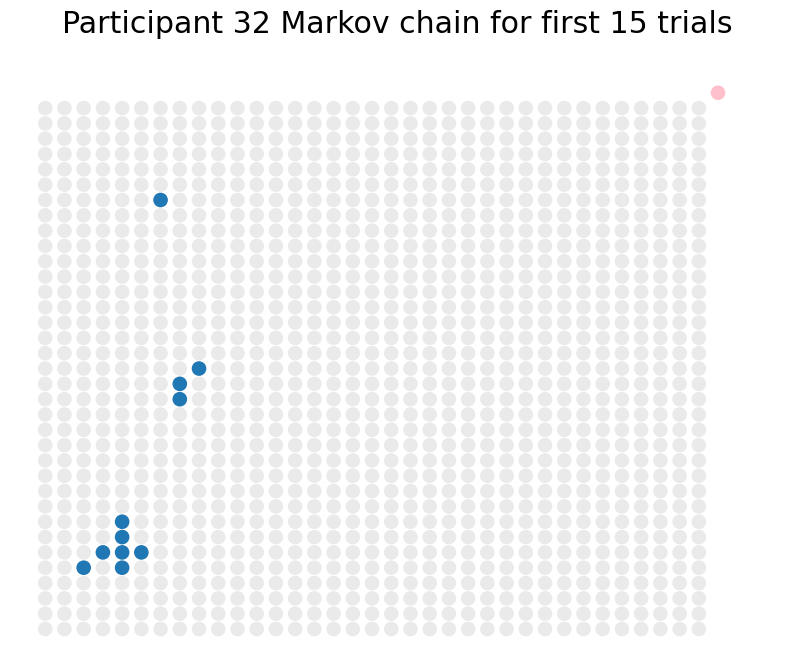

Subj num 32 name user_1642090166686
Number of states visited for first 15 trials: 11
Average state probability for first 15 trials: 1.3636363636363635


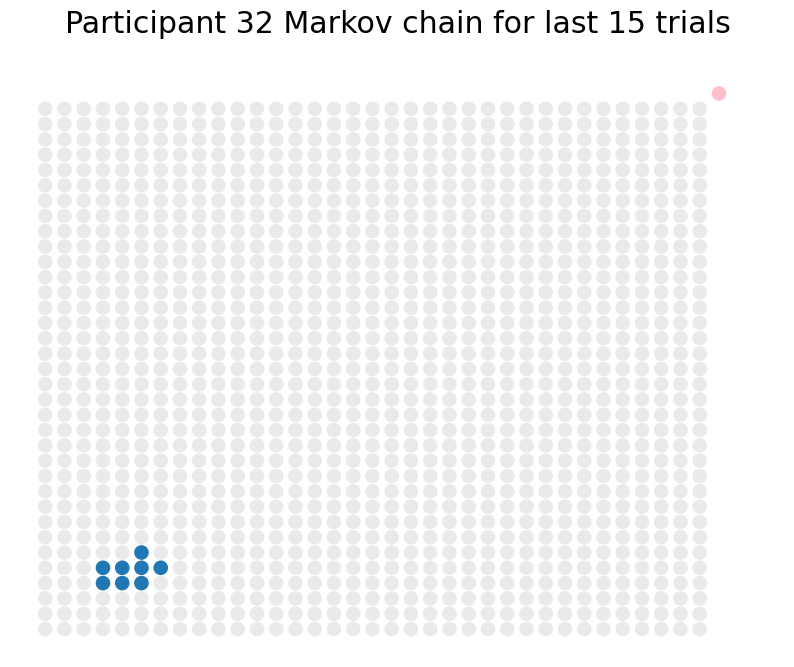

Subj num 32 name user_1642090166686
Number of states visited for last 15 trials: 8
Average state probability for last 15 trials: 1.875


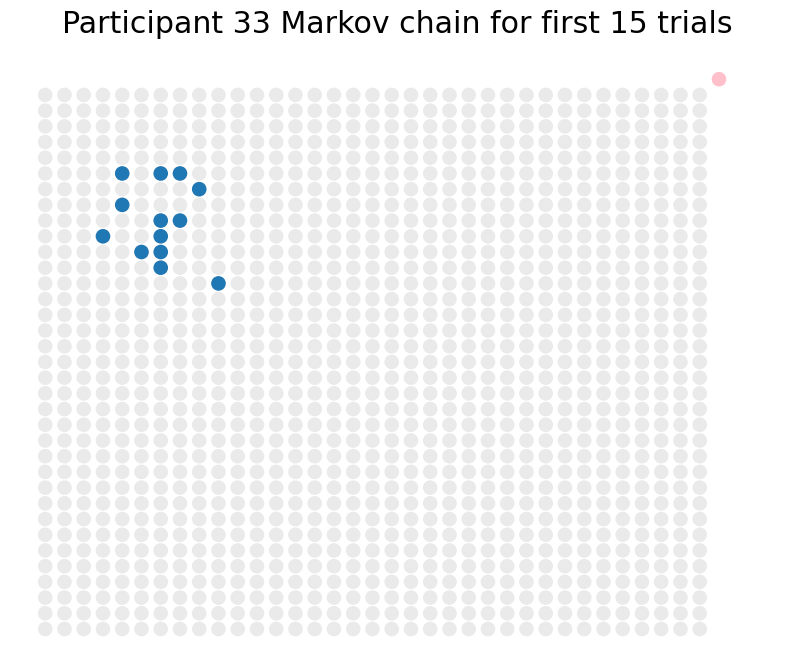

Subj num 33 name user_1642090145108
Number of states visited for first 15 trials: 13
Average state probability for first 15 trials: 1.1538461538461537


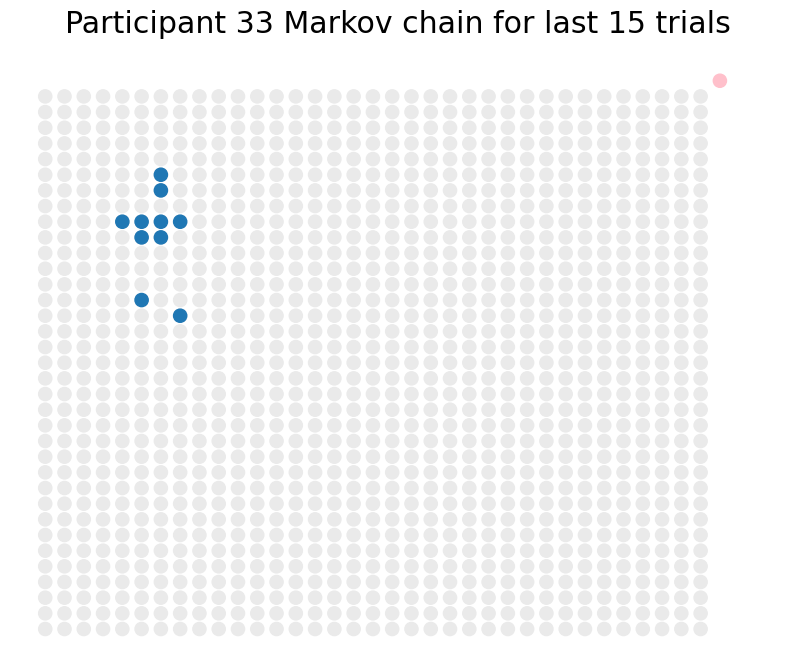

Subj num 33 name user_1642090145108
Number of states visited for last 15 trials: 10
Average state probability for last 15 trials: 1.5


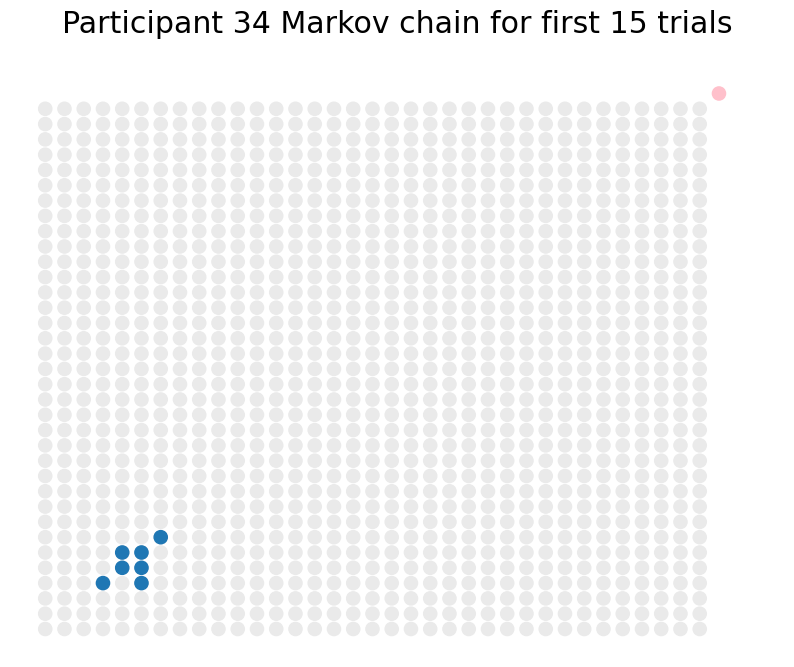

Subj num 34 name user_1642090338056
Number of states visited for first 15 trials: 7
Average state probability for first 15 trials: 2.142857142857143


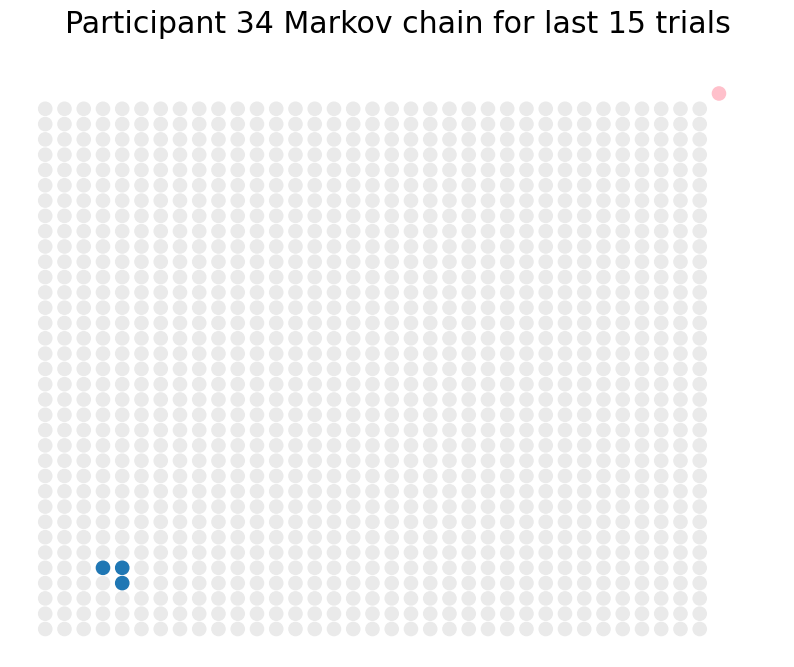

Subj num 34 name user_1642090338056
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


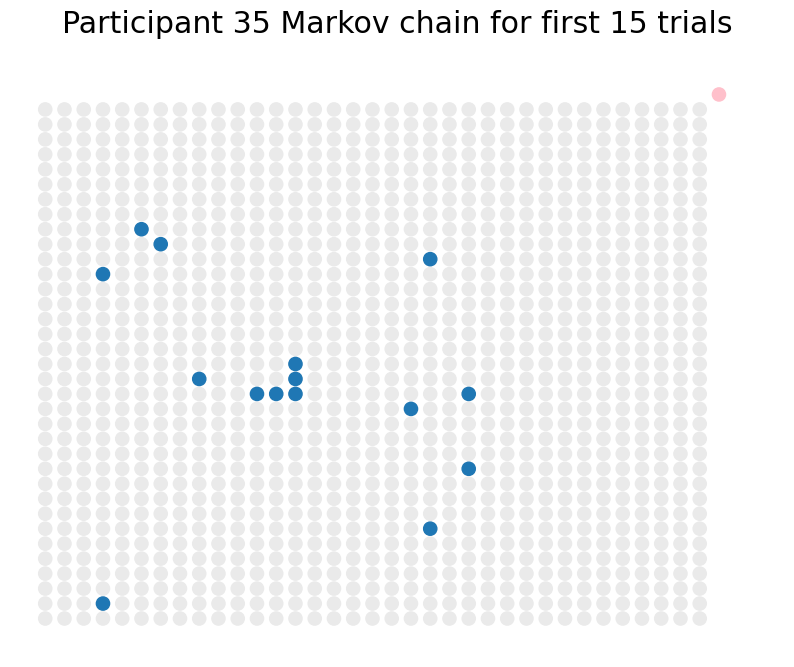

Subj num 35 name user_1642091482782
Number of states visited for first 15 trials: 15
Average state probability for first 15 trials: 1.0


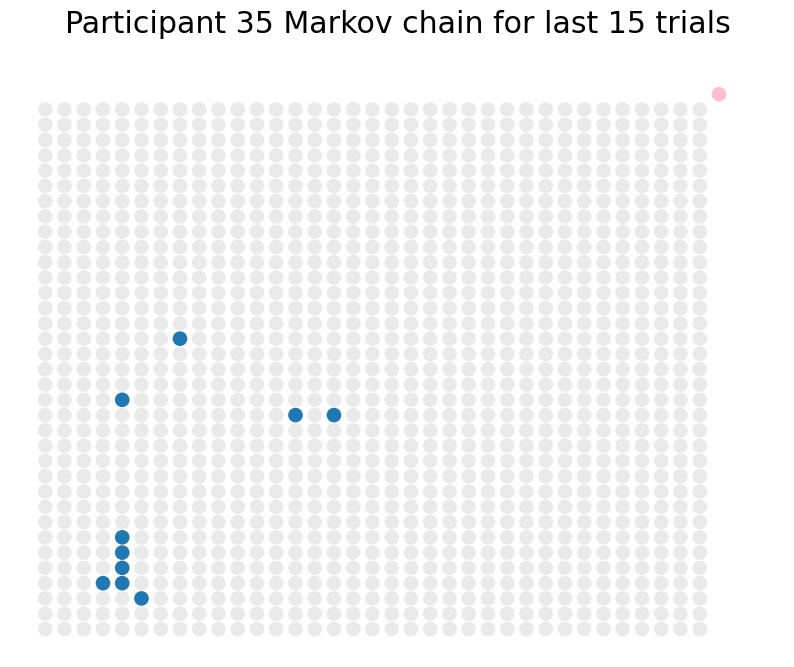

Subj num 35 name user_1642091482782
Number of states visited for last 15 trials: 10
Average state probability for last 15 trials: 1.5


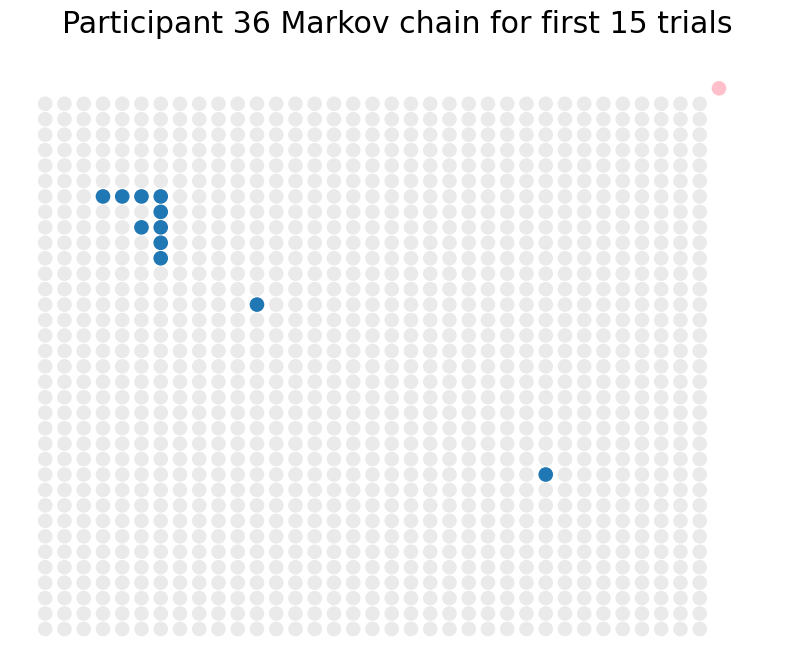

Subj num 36 name user_1642091073047
Number of states visited for first 15 trials: 11
Average state probability for first 15 trials: 1.3636363636363635


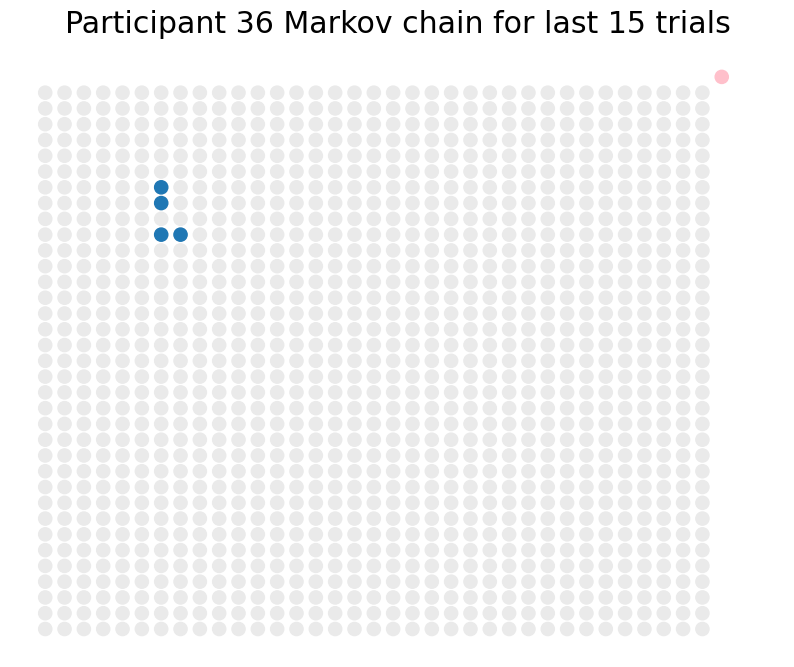

Subj num 36 name user_1642091073047
Number of states visited for last 15 trials: 4
Average state probability for last 15 trials: 3.75


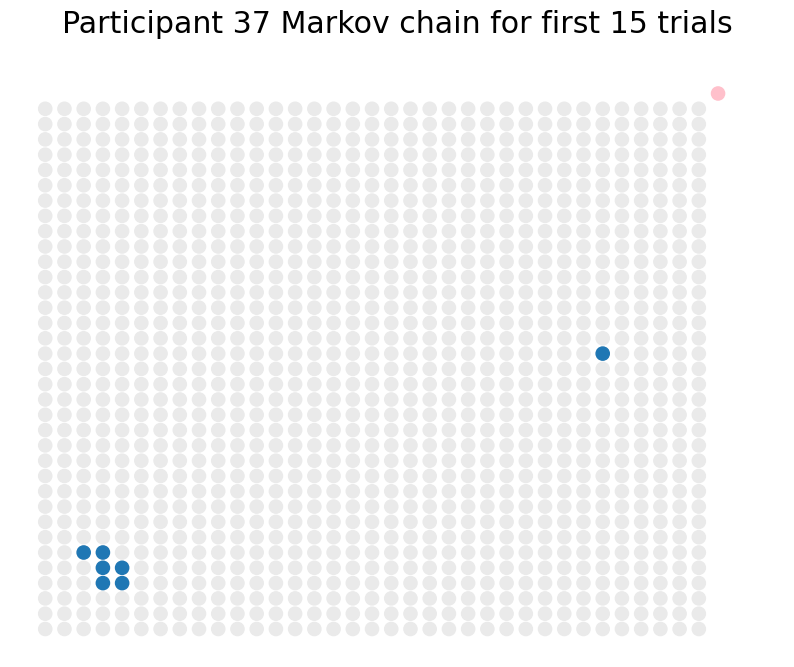

Subj num 37 name user_1642094649057
Number of states visited for first 15 trials: 7
Average state probability for first 15 trials: 2.142857142857143


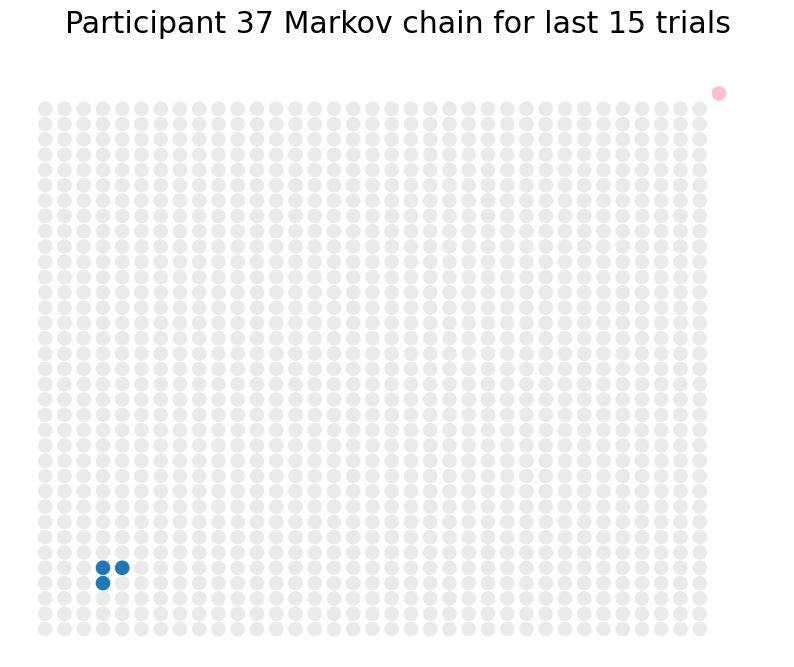

Subj num 37 name user_1642094649057
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


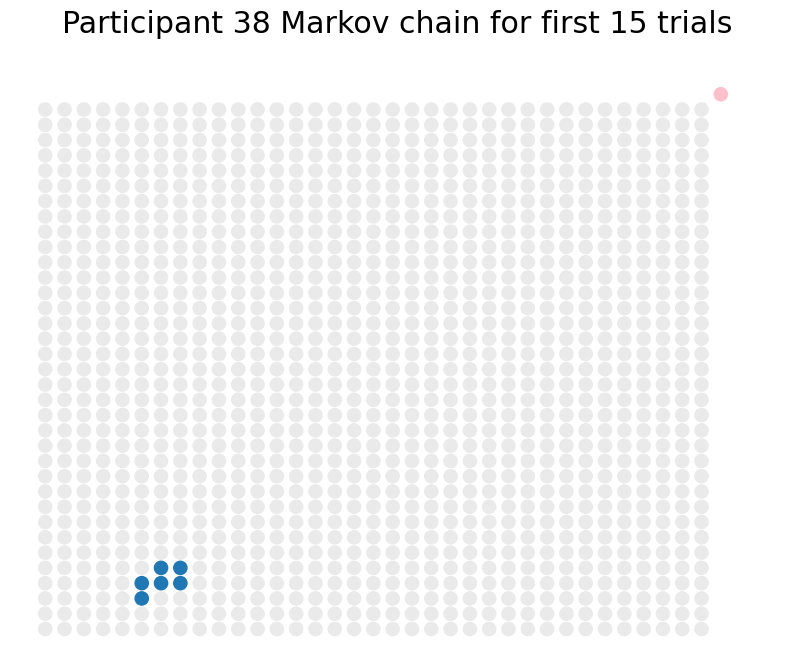

Subj num 38 name user_1642092410753
Number of states visited for first 15 trials: 6
Average state probability for first 15 trials: 2.5


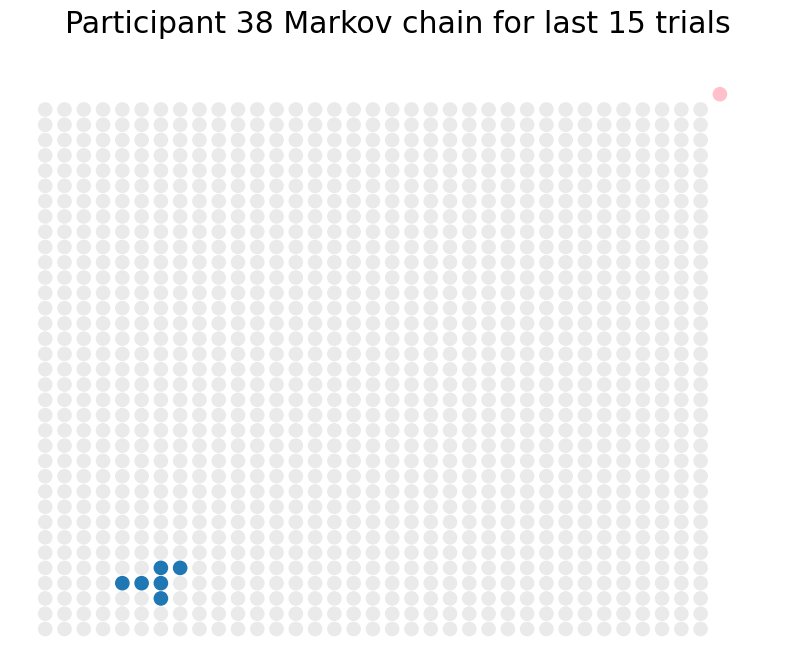

Subj num 38 name user_1642092410753
Number of states visited for last 15 trials: 6
Average state probability for last 15 trials: 2.5


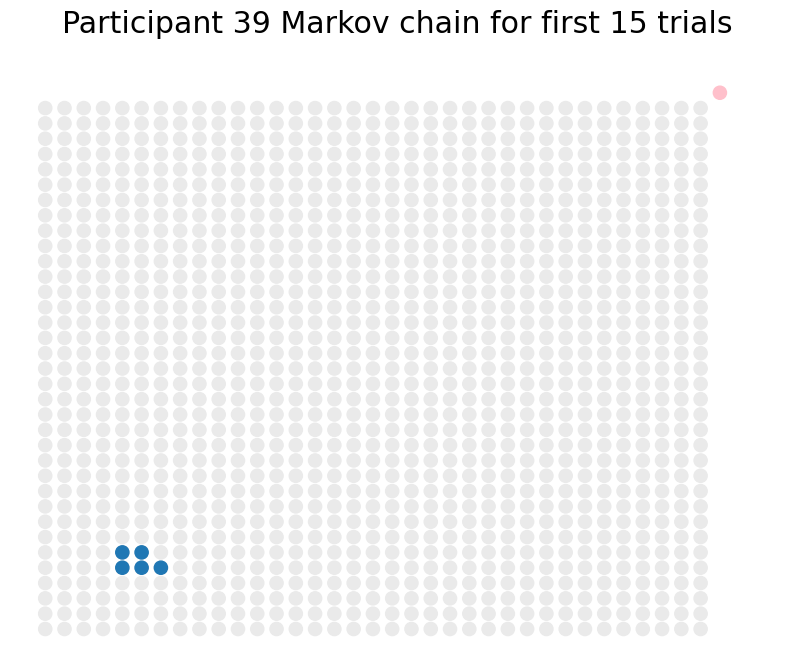

Subj num 39 name user_1642092226691
Number of states visited for first 15 trials: 5
Average state probability for first 15 trials: 3.0


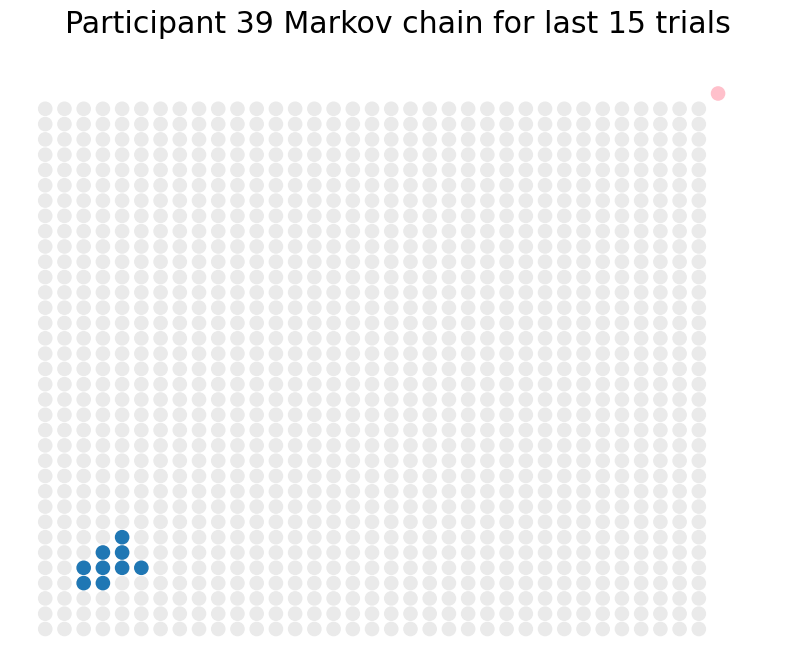

Subj num 39 name user_1642092226691
Number of states visited for last 15 trials: 9
Average state probability for last 15 trials: 1.6666666666666667


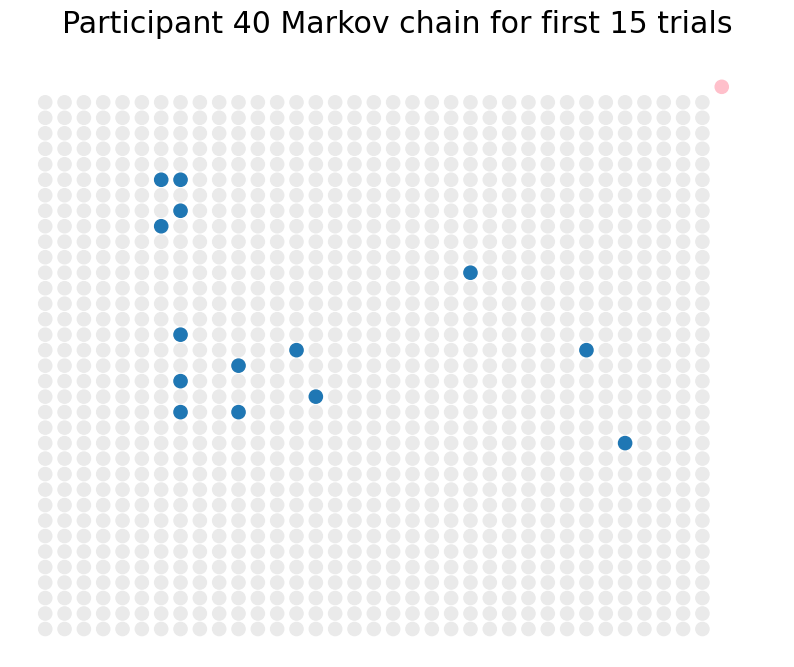

Subj num 40 name user_1642094939546
Number of states visited for first 15 trials: 14
Average state probability for first 15 trials: 1.0714285714285714


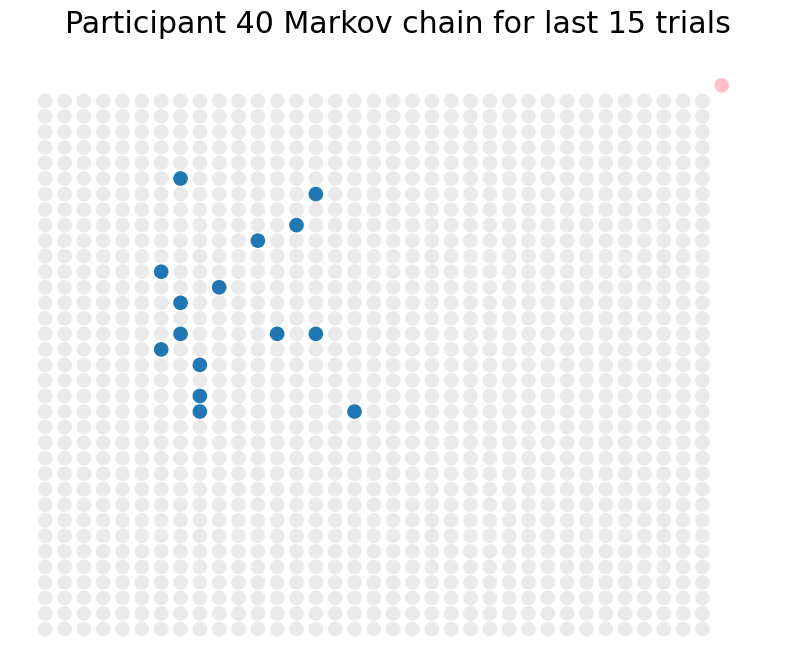

Subj num 40 name user_1642094939546
Number of states visited for last 15 trials: 15
Average state probability for last 15 trials: 1.0


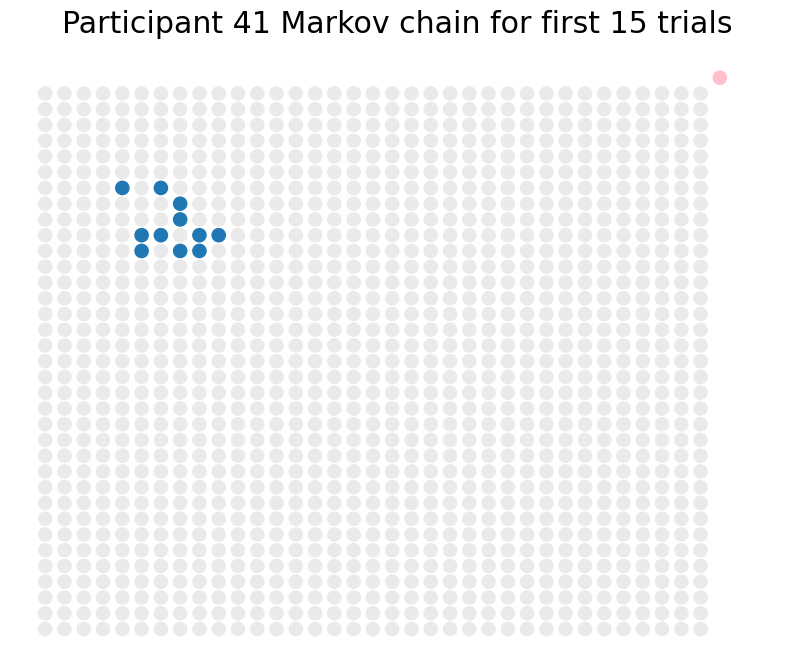

Subj num 41 name user_1642096798912
Number of states visited for first 15 trials: 11
Average state probability for first 15 trials: 1.3636363636363635


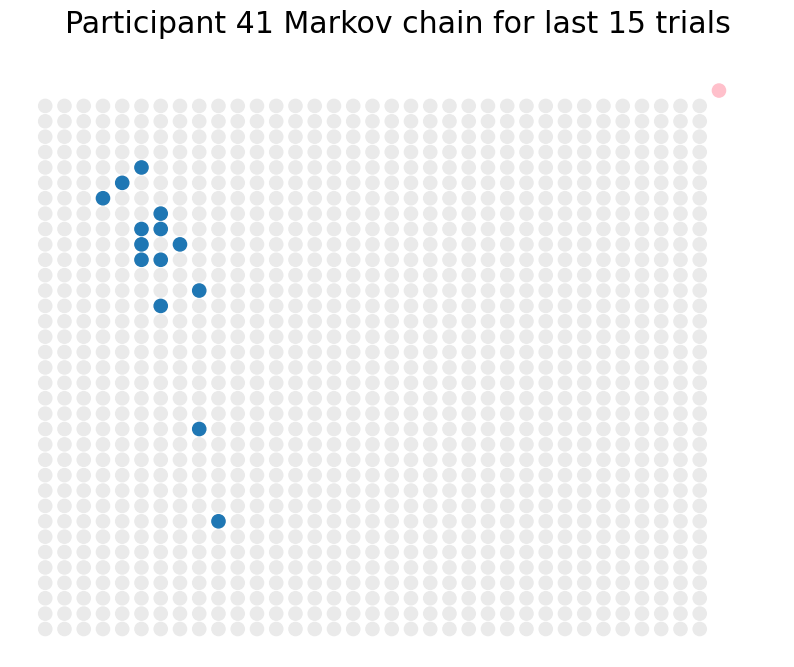

Subj num 41 name user_1642096798912
Number of states visited for last 15 trials: 14
Average state probability for last 15 trials: 1.0714285714285714


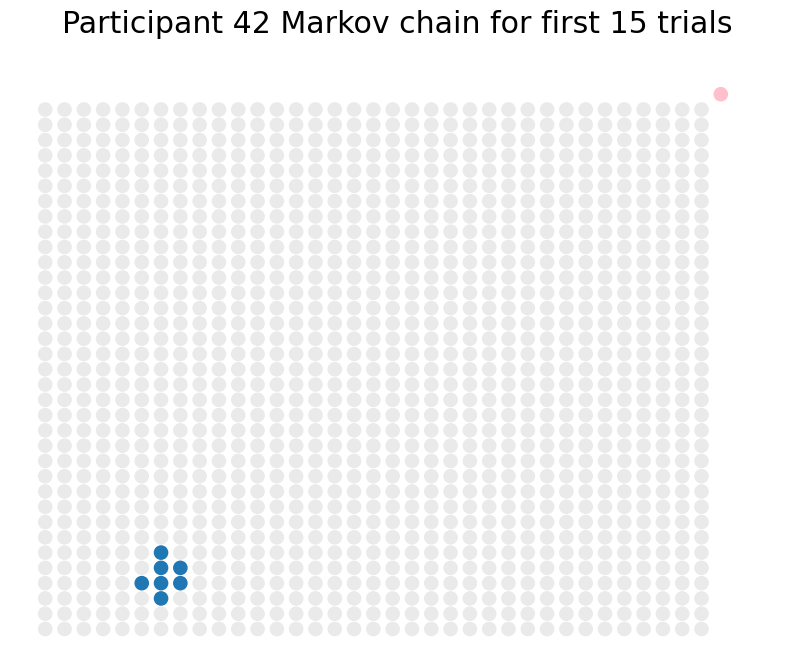

Subj num 42 name user_1642095328460
Number of states visited for first 15 trials: 7
Average state probability for first 15 trials: 2.142857142857143


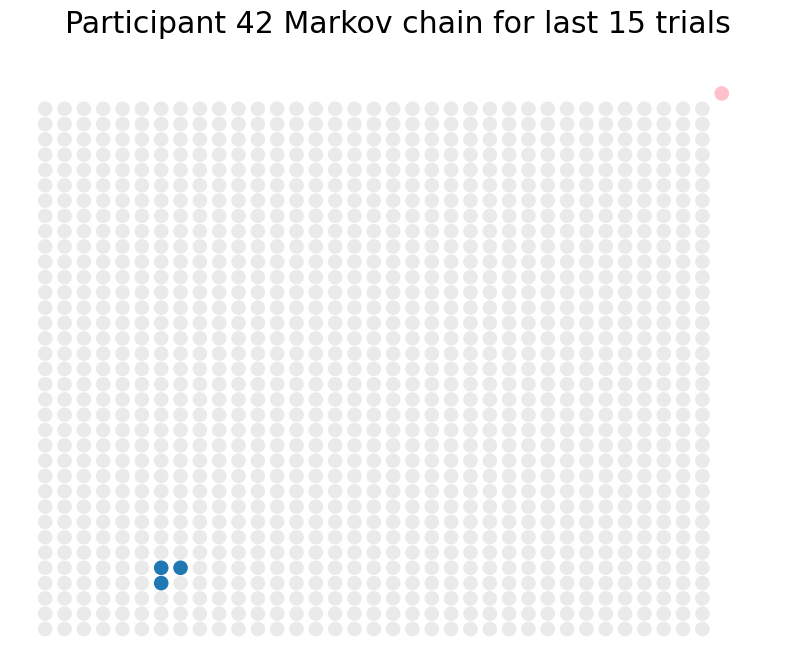

Subj num 42 name user_1642095328460
Number of states visited for last 15 trials: 3
Average state probability for last 15 trials: 5.0


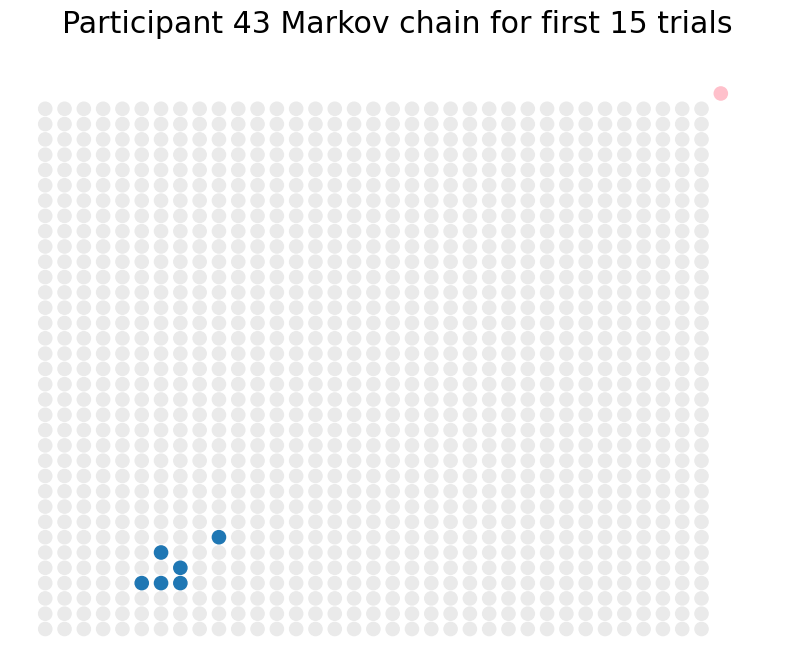

Subj num 43 name user_1642097953064
Number of states visited for first 15 trials: 6
Average state probability for first 15 trials: 2.5


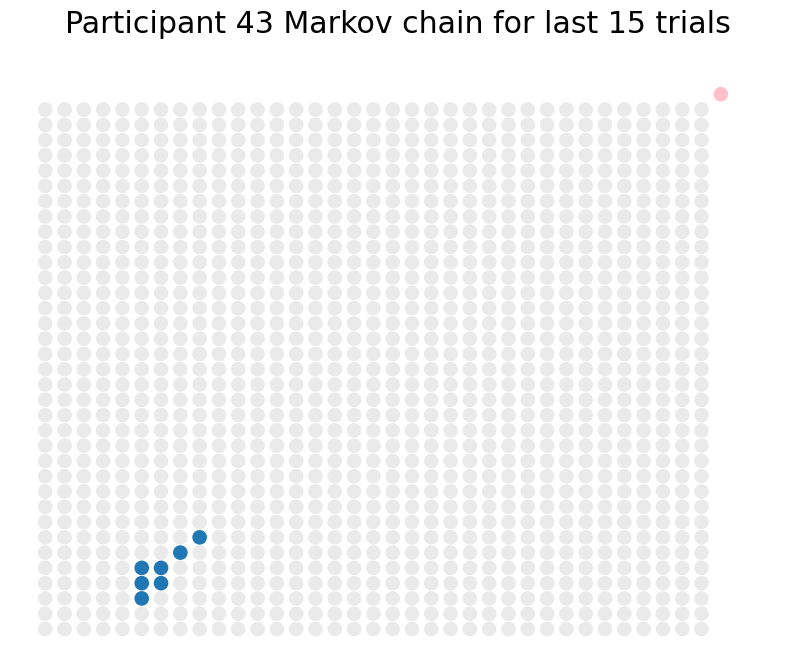

Subj num 43 name user_1642097953064
Number of states visited for last 15 trials: 7
Average state probability for last 15 trials: 2.142857142857143


In [25]:
avg_state_probs = plot_markov_chains(subj_num=[n for n in range(len(df_clean['name']))], df=df_clean,
                                     adj_mat=adjacency_matrices, grid_width=grid_width, states=states,
                                     label_alpha=0, wt_alpha=0)